# Unsupervised Learning: Trade & Ahead

## Problem Statement

### Context

The stock market has consistently proven to be a good place to invest in and save for the future. There are a lot of compelling reasons to invest in stocks. It can help in fighting inflation, create wealth, and also provides some tax benefits. Good steady returns on investments over a long period of time can also grow a lot more than seems possible. Also, thanks to the power of compound interest, the earlier one starts investing, the larger the corpus one can have for retirement. Overall, investing in stocks can help meet life's financial aspirations.

It is important to maintain a diversified portfolio when investing in stocks in order to maximise earnings under any market condition. Having a diversified portfolio tends to yield higher returns and face lower risk by tempering potential losses when the market is down. It is often easy to get lost in a sea of financial metrics to analyze while determining the worth of a stock, and doing the same for a multitude of stocks to identify the right picks for an individual can be a tedious task. By doing a cluster analysis, one can identify stocks that exhibit similar characteristics and ones which exhibit minimum correlation. This will help investors better analyze stocks across different market segments and help protect against risks that could make the portfolio vulnerable to losses.


### Objective

Trade&Ahead is a financial consultancy firm who provide their customers with personalized investment strategies. They have hired you as a Data Scientist and provided you with data comprising stock price and some financial indicators for a few companies listed under the New York Stock Exchange. They have assigned you the tasks of analyzing the data, grouping the stocks based on the attributes provided, and sharing insights about the characteristics of each group.

### Data Dictionary

- Ticker Symbol: An abbreviation used to uniquely identify publicly traded shares of a particular stock on a particular stock market
- Company: Name of the company
- GICS Sector: The specific economic sector assigned to a company by the Global Industry Classification Standard (GICS) that best defines its business operations
- GICS Sub Industry: The specific sub-industry group assigned to a company by the Global Industry Classification Standard (GICS) that best defines its business operations
- Current Price: Current stock price in dollars
- Price Change: Percentage change in the stock price in 13 weeks
- Volatility: Standard deviation of the stock price over the past 13 weeks
- ROE: A measure of financial performance calculated by dividing net income by shareholders' equity (shareholders' equity is equal to a company's assets minus its debt)
- Cash Ratio: The ratio of a  company's total reserves of cash and cash equivalents to its total current liabilities
- Net Cash Flow: The difference between a company's cash inflows and outflows (in dollars)
- Net Income: Revenues minus expenses, interest, and taxes (in dollars)
- Earnings Per Share: Company's net profit divided by the number of common shares it has outstanding (in dollars)
- Estimated Shares Outstanding: Company's stock currently held by all its shareholders
- P/E Ratio: Ratio of the company's current stock price to the earnings per share
- P/B Ratio: Ratio of the company's stock price per share by its book value per share (book value of a company is the net difference between that company's total assets and total liabilities)

## Importing necessary libraries and data

In [1]:
# Installing the libraries with the specified version.
# uncomment and run the following line if Google Colab is being used
# !pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 yellowbrick==1.5 -q --user

In [2]:
# Installing the libraries with the specified version.
# uncomment and run the following lines if Jupyter Notebook is being used
#!pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.2 yellowbrick==1.5 -q --user
#!pip install yellowbrick==1.5
#!pip install --upgrade jinja2

In [3]:
# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

# Libraries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style='darkgrid')

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)

# to scale the data using z-score
from sklearn.preprocessing import StandardScaler

# to compute distances
from scipy.spatial.distance import cdist, pdist

# to perform k-means clustering and compute silhouette scores
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# to visualize the elbow curve and silhouette scores
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

# to perform hierarchical clustering, compute cophenetic correlation, and create dendrograms
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet

# to suppress warnings
import warnings
warnings.filterwarnings("ignore")

**Note**: *After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again.*

In [4]:
%matplotlib inline

## Data Overview

- Observations
- Sanity checks

The initial steps to get an overview of any dataset is to:

observe the first few rows of the dataset, to check whether the dataset has been loaded properly or not
get information about the number of rows and columns in the dataset
find out the data types of the columns to ensure that data is stored in the preferred format and the value of each property is as expected.
check the statistical summary of the dataset to get an overview of the numerical columns of the data

In [5]:
df_stock_data = pd.read_csv("stock_data.csv")

In [6]:
df_stock_data.head()

,Ticker Symbol,Security,GICS Sector,GICS Sub Industry,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio
0,AAL,American Airlines Group,Industrials,Airlines,42.349998,9.999995,1.687151,135,51,-604000000,7610000000,11.39,6.681299e+08,3.718174,-8.784219
1,ABBV,AbbVie,Health Care,Pharmaceuticals,59.240002,8.339433,2.197887,130,77,51000000,5144000000,3.15,1.633016e+09,18.806350,-8.750068
2,ABT,Abbott Laboratories,Health Care,Health Care Equipment,44.910000,11.301121,1.273646,21,67,938000000,4423000000,2.94,1.504422e+09,15.275510,-0.394171
3,ADBE,Adobe Systems Inc,Information Technology,Application Software,93.940002,13.977195,1.357679,9,180,-240840000,629551000,1.26,4.996437e+08,74.555557,4.199651
4,ADI,"Analog Devices, Inc.",Information Technology,Semiconductors,55.320000,-1.827858,1.701169,14,272,315120000,696878000,0.31,2.247994e+09,178.451613,1.059810


In [7]:
df_stock_data.tail()

,Ticker Symbol,Security,GICS Sector,GICS Sub Industry,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio
335,YHOO,Yahoo Inc.,Information Technology,Internet Software & Services,33.259998,14.887727,1.845149,15,459,-1032187000,-4359082000,-4.64,939457327.6,28.976191,6.261775
336,YUM,Yum! Brands Inc,Consumer Discretionary,Restaurants,52.516175,-8.698917,1.478877,142,27,159000000,1293000000,2.97,435353535.4,17.682214,-3.838260
337,ZBH,Zimmer Biomet Holdings,Health Care,Health Care Equipment,102.589996,9.347683,1.404206,1,100,376000000,147000000,0.78,188461538.5,131.525636,-23.884449
338,ZION,Zions Bancorp,Financials,Regional Banks,27.299999,-1.158588,1.468176,4,99,-43623000,309471000,1.20,257892500.0,22.749999,-0.063096
339,ZTS,Zoetis,Health Care,Pharmaceuticals,47.919998,16.678836,1.610285,32,65,272000000,339000000,0.68,498529411.8,70.470585,1.723068


In [8]:
# check shape of dataset
df_stock_data.shape

(340, 15)

In [9]:
# Check the data types of the columns for the dataset
df_stock_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 340 entries, 0 to 339
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Ticker Symbol                 340 non-null    object 
 1   Security                      340 non-null    object 
 2   GICS Sector                   340 non-null    object 
 3   GICS Sub Industry             340 non-null    object 
 4   Current Price                 340 non-null    float64
 5   Price Change                  340 non-null    float64
 6   Volatility                    340 non-null    float64
 7   ROE                           340 non-null    int64  
 8   Cash Ratio                    340 non-null    int64  
 9   Net Cash Flow                 340 non-null    int64  
 10  Net Income                    340 non-null    int64  
 11  Earnings Per Share            340 non-null    float64
 12  Estimated Shares Outstanding  340 non-null    float64
 13  P/E R

In [10]:
# check duplicates if any
df_stock_data.duplicated().sum()

0

In [11]:
# check missing values if any
df_stock_data.isnull().sum()

Ticker Symbol                   0
Security                        0
GICS Sector                     0
GICS Sub Industry               0
Current Price                   0
Price Change                    0
Volatility                      0
ROE                             0
Cash Ratio                      0
Net Cash Flow                   0
Net Income                      0
Earnings Per Share              0
Estimated Shares Outstanding    0
P/E Ratio                       0
P/B Ratio                       0
dtype: int64

In [12]:
# Statistical summarry on the numerical dataset
df_stock_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Current Price,340.0,8.086234e+01,9.805509e+01,4.500000e+00,3.855500e+01,5.970500e+01,9.288000e+01,1.274950e+03
Price Change,340.0,4.078194e+00,1.200634e+01,-4.712969e+01,-9.394838e-01,4.819505e+00,1.069549e+01,5.505168e+01
Volatility,340.0,1.525976e+00,5.917984e-01,7.331632e-01,1.134878e+00,1.385593e+00,1.695549e+00,4.580042e+00
ROE,340.0,3.959706e+01,9.654754e+01,1.000000e+00,9.750000e+00,1.500000e+01,2.700000e+01,9.170000e+02
Cash Ratio,340.0,7.002353e+01,9.042133e+01,0.000000e+00,1.800000e+01,4.700000e+01,9.900000e+01,9.580000e+02
Net Cash Flow,340.0,5.553762e+07,1.946365e+09,-1.120800e+10,-1.939065e+08,2.098000e+06,1.698108e+08,2.076400e+10
Net Income,340.0,1.494385e+09,3.940150e+09,-2.352800e+10,3.523012e+08,7.073360e+08,1.899000e+09,2.444200e+10
Earnings Per Share,340.0,2.776662e+00,6.587779e+00,-6.120000e+01,1.557500e+00,2.895000e+00,4.620000e+00,5.009000e+01
Estimated Shares Outstanding,340.0,5.770283e+08,8.458496e+08,2.767216e+07,1.588482e+08,3.096751e+08,5.731175e+08,6.159292e+09
P/E Ratio,340.0,3.261256e+01,4.434873e+01,2.935451e+00,1.504465e+01,2.081988e+01,3.176476e+01,5.280391e+02


### Observations ###

  -  `Ticker Symbol`, `Security`, `GICS Sector`, `GICS Sub Industry` is a string object.
  -  `ROE`, `Cash Ratio`, `Net Cash Flow`, `Net Income` is of type integer.
  -  `Price Change`, `Volatility`, `Earnings Per Share`, `Estimated Shares Outstanding`, `P/E Ratio` `P/B Ratio`, is of type float
  -   Apply cluster analysis to the stock data, need to group companies with similar financial and market behavior 
   
### Sanity checks ###
  -  There are no duplicates.
  -  There are no missing values, that means missing values treatment may not be required before building up the model

### Statistical Summary ###
- Stock prices in the dataset range from `$4.50` to over `$1,274`, with an average price of approximately `$80.86`. This wide range suggests that the dataset includes companies of varying sizes and market capitalizations, from low-priced stocks to high-value blue-chip firms.

- Volatility Is Low on Average
The average volatility is approximately 1.53, with most stocks falling between 1.13 and 1.70 (25th to 75th percentile), suggesting relatively stable price movements for the majority of stocks in the dataset.

- Negative Outliers in ROE and P/B Ratio
While the mean Return on Equity (ROE) is about 39.6, there is a minimum of just 1, and some very high values (max = 917), suggesting the presence of a few extreme performers or outliers.
Also, the P/B Ratio has a negative mean and median, which is unusual and may point to data issues or companies with negative book value.

- Wide Spread in Financial Health
The Net Cash Flow and Net Income values range from large negative values to over $20B, with standard deviations larger than their means, indicating high variability in financial performance across companies.

- Price-to-Earnings (P/E) Ratios Are Skewed
The average P/E Ratio is 32.61, but the standard deviation is even higher at 44.34, and the max exceeds 5000, suggesting a skewed distribution with potential speculative stocks.

- Cash Ratios Show Strong Liquidity in Some Firms
Although the median Cash Ratio is 9.9, the maximum is nearly 958, which could be indicative of highly liquid firms, likely hoarding cash or having minimal liabilities.

## Exploratory Data Analysis (EDA)

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Questions**:

1. What does the distribution of stock prices look like?
2. The stocks of which economic sector have seen the maximum price increase on average?
3. How are the different variables correlated with each other?
4. Cash ratio provides a measure of a company's ability to cover its short-term obligations using only cash and cash equivalents. How does the average cash ratio vary across economic sectors?
5. P/E ratios can help determine the relative value of a company's shares as they signify the amount of money an investor is willing to invest in a single share of a company per dollar of its earnings. How does the P/E ratio vary, on average, across economic sectors?

**1. What does the distribution of stock prices look like?**

The stock prices in the dataset range from `$4.50` to over `$1,274`, with an average price of approximately `$80.86`. This wide range suggests that the dataset includes companies of varying sizes and market capitalizations, from low-priced stocks to high-value firms.

**2. The stocks of which economic sector have seen the maximum price increase on average?**

In [13]:
# Group by GICS Sector and calculate average Price Change
avg_change = df_stock_data.groupby("GICS Sector")["Price Change"].mean()
top_sector = avg_change.idxmax()
top_value = avg_change.max()

print(f"The sector with the highest average price increase is '{top_sector}' with an average change of {top_value :.2f}.")


The sector with the highest average price increase is 'Health Care' with an average change of 9.59.


**3. How are the different variables correlated with each other?**

In [14]:
# Compute pairwise correlation of all numerical columns
correlation_matrix = df_stock_data.corr(numeric_only=True)
correlation_matrix

,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio
Current Price,1.000000,0.134982,-0.124257,-0.000549,0.127816,-0.021961,0.036625,0.479604,-0.145306,0.260273,0.124634
Price Change,0.134982,1.000000,-0.408281,-0.043310,0.168586,0.026746,0.179298,0.175401,0.033656,-0.002491,0.034329
Volatility,-0.124257,-0.408281,1.000000,0.162532,0.020605,-0.014172,-0.383433,-0.379309,-0.095704,0.263600,0.046528
ROE,-0.000549,-0.043310,0.162532,1.000000,-0.069122,-0.052205,-0.288524,-0.405291,-0.030288,0.023341,-0.063218
Cash Ratio,0.127816,0.168586,0.020605,-0.069122,1.000000,0.113819,0.028589,0.024759,0.135869,0.089483,0.229672
Net Cash Flow,-0.021961,0.026746,-0.014172,-0.052205,0.113819,1.000000,0.044229,0.019348,-0.051392,0.026876,0.057039
Net Income,0.036625,0.179298,-0.383433,-0.288524,0.028589,0.044229,1.000000,0.557752,0.589310,-0.224022,-0.061544
Earnings Per Share,0.479604,0.175401,-0.379309,-0.405291,0.024759,0.019348,0.557752,1.000000,-0.026906,-0.260660,0.014915
Estimated Shares Outstanding,-0.145306,0.033656,-0.095704,-0.030288,0.135869,-0.051392,0.589310,-0.026906,1.000000,-0.014551,-0.028155
P/E Ratio,0.260273,-0.002491,0.263600,0.023341,0.089483,0.026876,-0.224022,-0.260660,-0.014551,1.000000,0.036422


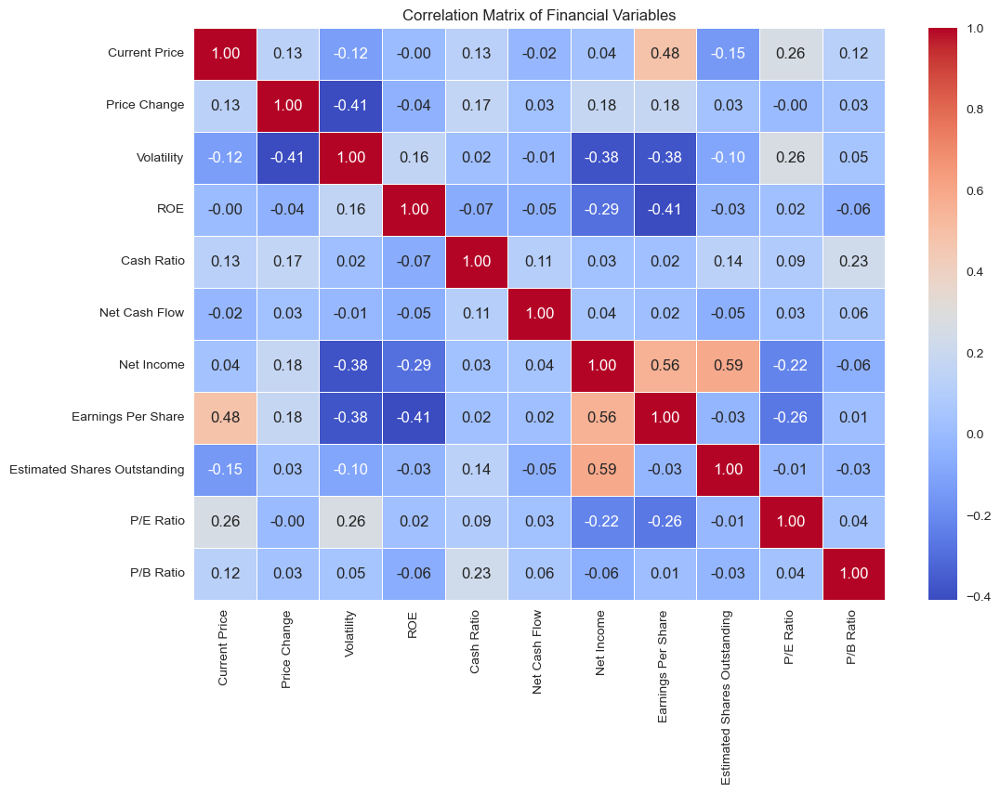

In [15]:
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix of Financial Variables")
plt.show()

### Correlation Insights from the Dataset

Below are a few **critical relationships** observed from the correlation matrix:

---

#### 1. Earnings Per Share (EPS) and Net Income
- **Correlation: 0.56**
- **Interpretation:** There is a **strong positive correlation** between EPS and Net Income. 

---

#### 2. Volatility and Price Change
- **Correlation: -0.41**
- **Interpretation:** A **moderate negative correlation** suggests that more volatile stocks tend to have **less consistent or lower price changes**. 

---

#### 3. P/E Ratio and Volatility
- **Correlation: 0.26**
- **Interpretation:** A **positive correlation** indicates that stocks with higher volatility may also have higher P/E ratios.

---

#### 4. Estimated Shares Outstanding and Net Income
- **Correlation: 0.59**
- **Interpretation:** This **strong positive correlation** may indicate that **larger companies** (with more shares) tend to generate **higher net income**.

---

#### 5. EPS and ROE (Return on Equity)
- **Correlation: -0.41**
- **Interpretation:** there's a **moderate negative correlation**. 

---

These insights help to understand and highlight which variables move together and might influence one another, assisting in identifying key drivers of stock performance.

---


**4. Cash ratio provides a measure of a company's ability to cover its short-term obligations using only cash and cash equivalents. How does the average cash ratio vary across economic sectors?**

In [16]:
# Step 1: Group by GICS Sector and calculate average Cash Ratio
sector_cash_ratio = df_stock_data.groupby("GICS Sector")["Cash Ratio"].mean().reset_index()

# Step 2: Rename the column for clarity
sector_cash_ratio.columns = ["GICS Sector", "Average Cash Ratio"]

# Step 3: Sort by average cash ratio in descending order
sector_cash_ratio = sector_cash_ratio.sort_values(by="Average Cash Ratio", ascending=False)

# Step 4: Display the table
print(sector_cash_ratio.to_string(index=False))
print("---------------------------------------------------------------")

                GICS Sector  Average Cash Ratio
     Information Technology          149.818182
Telecommunications Services          117.000000
                Health Care          103.775000
                 Financials           98.591837
           Consumer Staples           70.947368
                     Energy           51.133333
                Real Estate           50.111111
     Consumer Discretionary           49.575000
                  Materials           41.700000
                Industrials           36.188679
                  Utilities           13.625000
---------------------------------------------------------------


**Observation**

1. "Information Technology and Telecommunications Services sectors maintain the highest average cash ratios, indicating strong liquidity positions that enhance their ability to cover short-term obligations using cash alone."

2. "Sectors like Utilities, Industrials, and Materials display comparatively lower average cash ratios, suggesting greater reliance on non-cash assets or external financing to meet short-term liabilities."

**5. P/E ratios can help determine the relative value of a company's shares as they signify the amount of money an investor is willing to invest in a single share of a company per dollar of its earnings. How does the P/E ratio vary, on average, across economic sectors?**

In [17]:
# Step 1: Group by GICS Sector and calculate average P/E Ratio
sector_pe_ratio = df_stock_data.groupby("GICS Sector")["P/E Ratio"].mean().reset_index()

# Step 2: Rename the column for clarity
sector_pe_ratio.columns = ["GICS Sector", "Average P/E Ratio"]

# Step 3: Sort by average P/E ratio in descending order
sector_pe_ratio = sector_pe_ratio.sort_values(by="Average P/E Ratio", ascending=False)

# Step 5: Display the table without index
print(sector_pe_ratio.to_string(index=False))
print("---------------------------------------------------------------")


                GICS Sector  Average P/E Ratio
                     Energy          72.897709
     Information Technology          43.782546
                Real Estate          43.065585
                Health Care          41.135272
     Consumer Discretionary          35.211613
           Consumer Staples          25.521195
                  Materials          24.585352
                  Utilities          18.719412
                Industrials          18.259380
                 Financials          16.023151
Telecommunications Services          12.222578
---------------------------------------------------------------


**Observation**

1. "The Energy sector currently exhibits the highest average P/E ratio across all sectors, suggesting either strong investor optimism or temporarily suppressed earnings driving valuation multiples upward."

2. "Traditional sectors like Financials, Industrials, and Telecommunications Services show the lowest average P/E ratios, reflecting more stable earnings expectations and potentially undervalued investment opportunities."

## Univariate analysis

**`Method` commonly used to draw histogram and box plot together and get crisp visuals designed for `numerical` variables**

In [18]:
# Reusable code  
# Visualize both the histogram and box plot for each variable to gain clear insights into the data distribution and characteristics.

def histogram_boxplot(data, feature, figsize=(15, 10), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (15,10))
    kde: whether to show the density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a triangle will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

**Method commonly used to draw bar plot  and get crisp visuals - designed for `categeorical` variables**

In [19]:
# Reusable code  
# Visualize the bar plot for each variable to gain clear insights into the data characteristics.

# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 2, 6))
    else:
        plt.figure(figsize=(n + 2, 6))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        order=data[feature].value_counts().index[:n],
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

**`Current Price`**

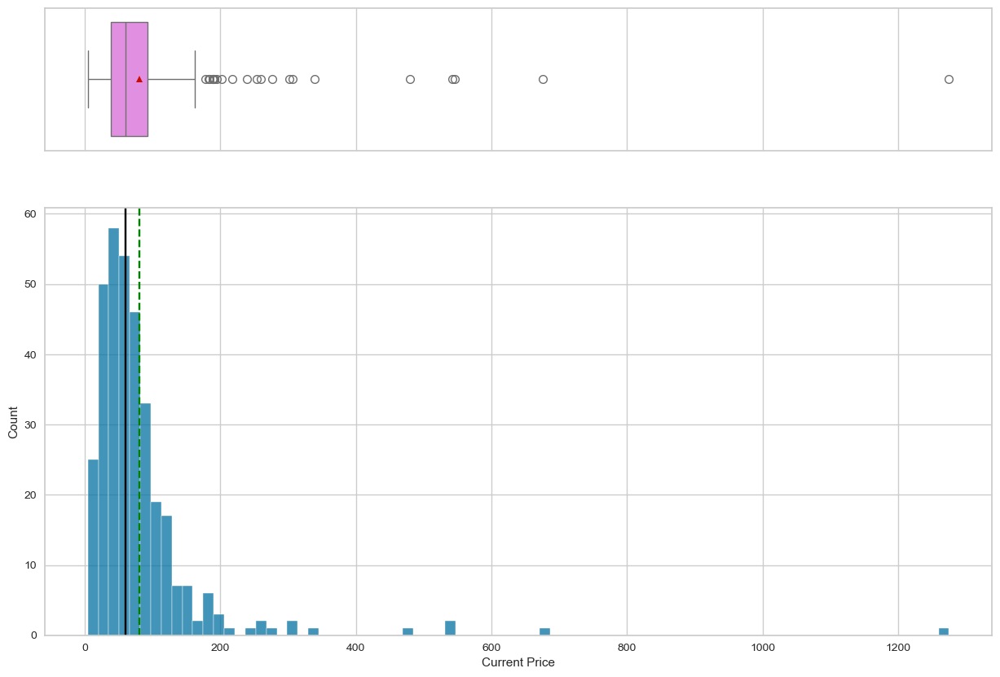

In [20]:
histogram_boxplot(df_stock_data, "Current Price")

**The distribution of current stock prices is highly right-skewed, with most stocks clustered under $150. While the mean price is notably higher than the median due to a few high-priced outliers, the majority of stocks trade at significantly lower prices.**

**`Price Change`**

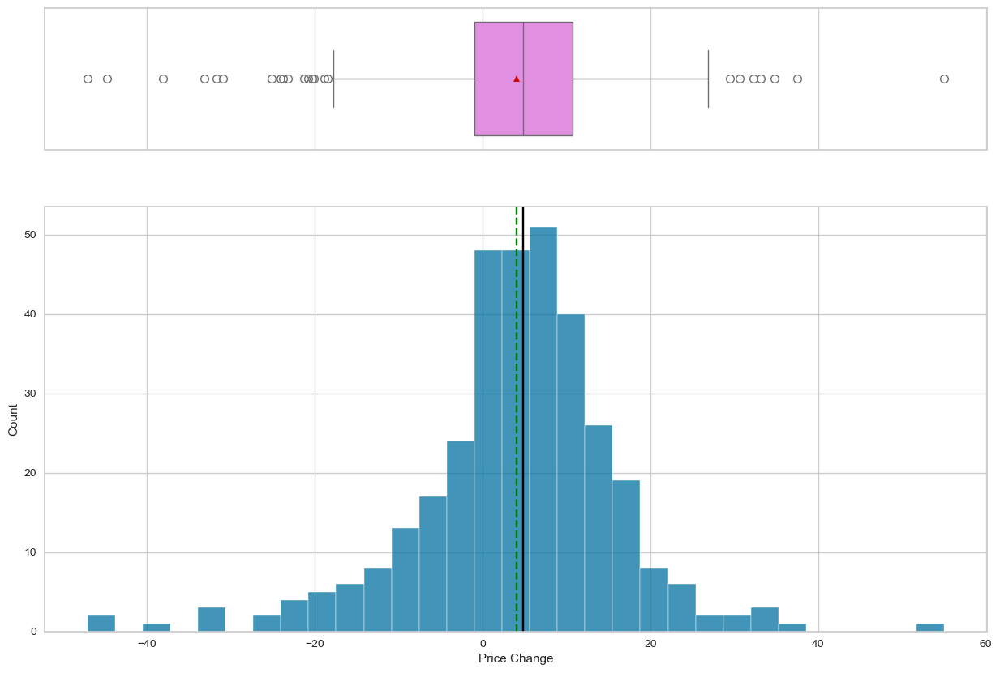

In [21]:
histogram_boxplot(df_stock_data, "Price Change")

**Price change is approximately symmetrically distributed with a slight right skew, indicating that most stocks experienced moderate gains or losses. The mean and median are closely aligned, but several extreme outliers on both ends suggest a few stocks had unusually high volatility.**

**`Volatility`**

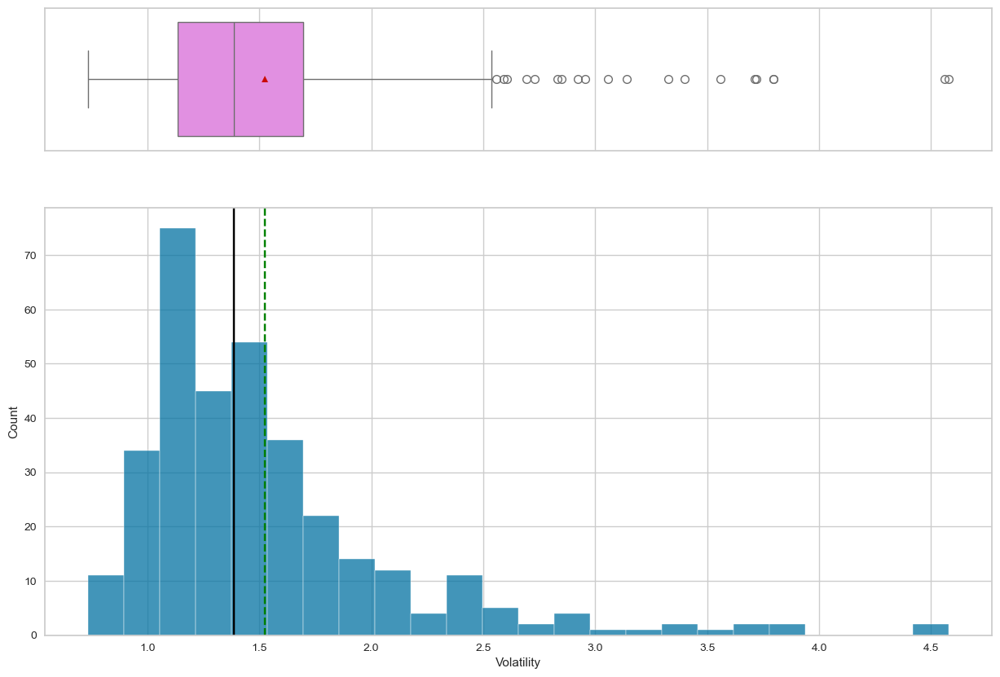

In [22]:
histogram_boxplot(df_stock_data, "Volatility")

**The distribution of stock volatility is moderately right-skewed, with most stocks clustering between 1.0 and 1.8. The mean is slightly higher than the median, and a long tail of outliers indicates a subset of highly volatile stocks, likely representing riskier investment opportunities**

**`ROE`**

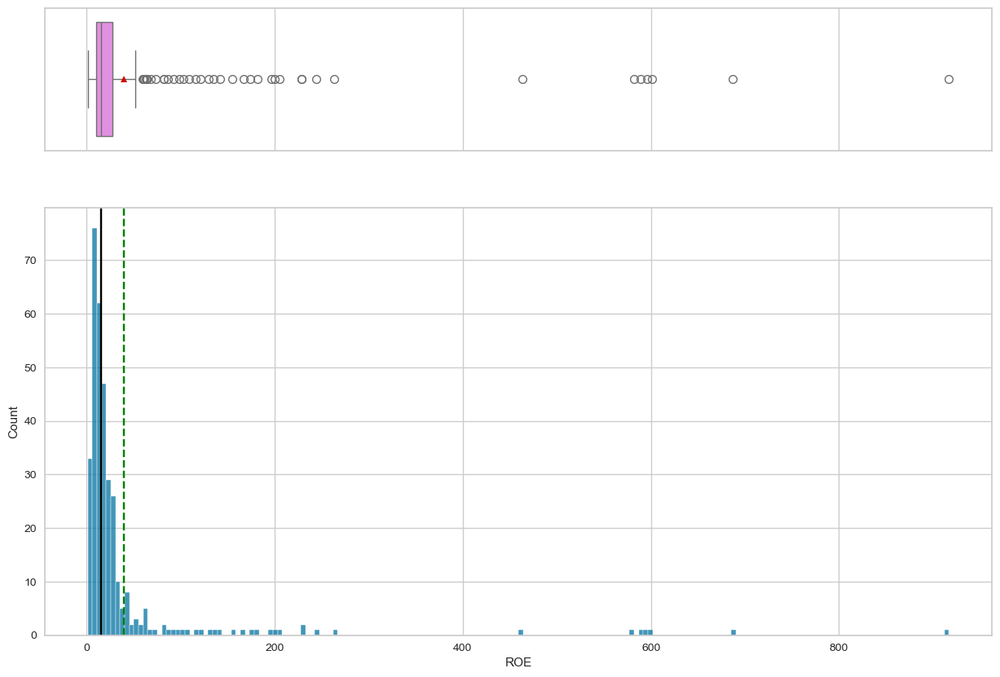

In [23]:
histogram_boxplot(df_stock_data, "ROE")

**ROE is extremely right-skewed, with most companies having moderate ROE values and a small number showing exceptionally high values. The mean is heavily influenced by extreme outliers, while the median remains relatively low, indicating that the typical company generates modest returns on equity.**

**`Cash Ratio`**

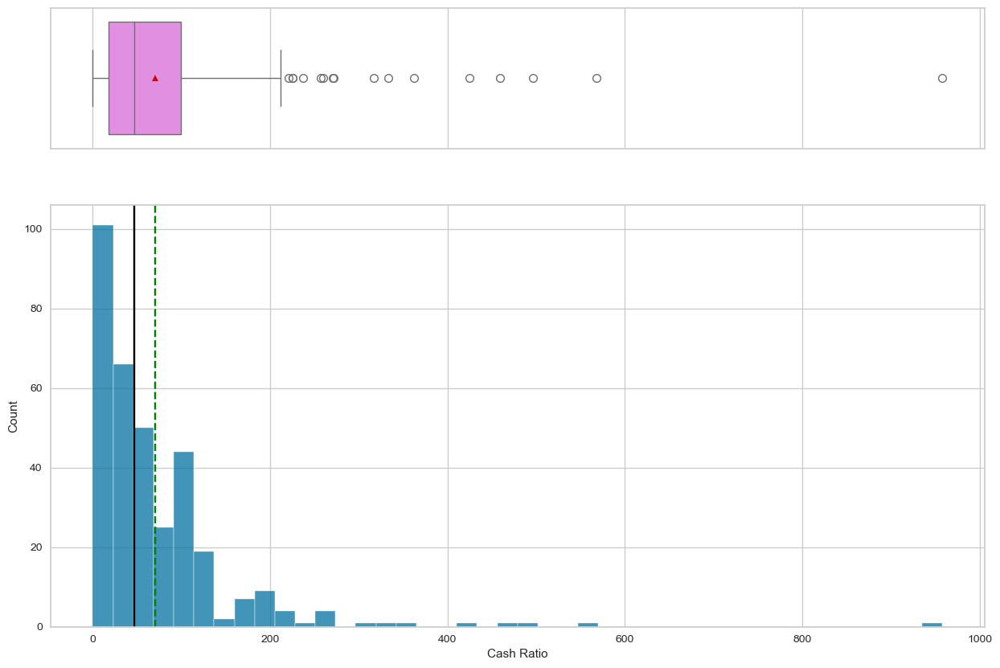

In [24]:
histogram_boxplot(df_stock_data, "Cash Ratio")

**Cash ratios are heavily right-skewed, with most companies maintaining relatively modest liquidity while a few outliers hold exceptionally high cash reserves. The median is well below the mean, indicating that typical firms keep just enough cash to cover short-term obligations, while a minority significantly exceed that threshold**

**`Net Cash Flow`**

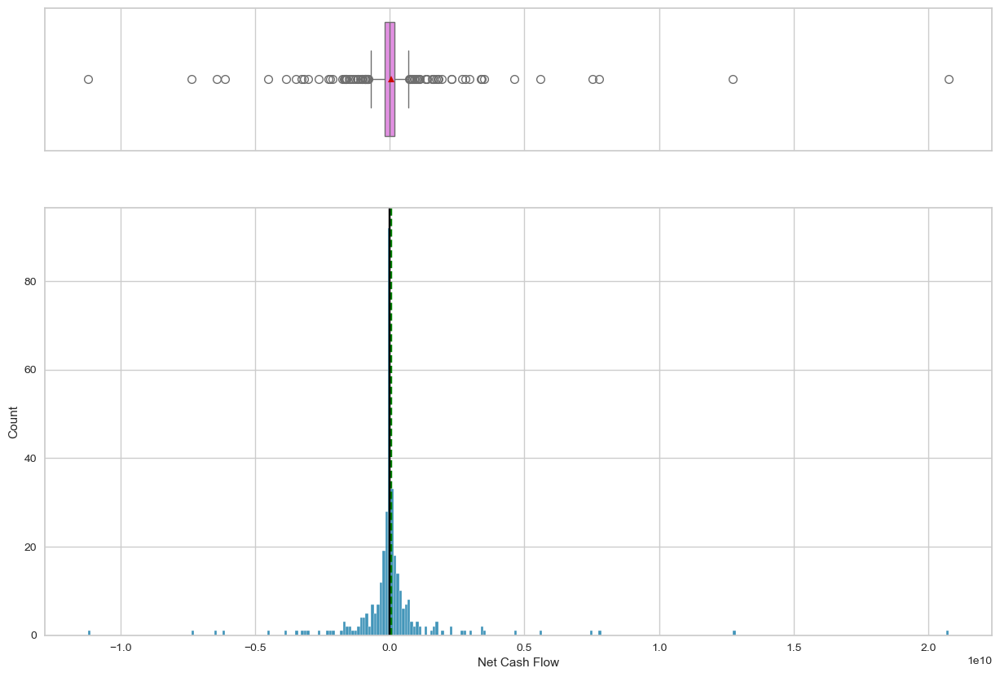

In [25]:
histogram_boxplot(df_stock_data, "Net Cash Flow")

**Net Cash Flow is tightly centered around zero with a high concentration of values near the median, but it exhibits extreme outliers on both the positive and negative ends. This suggests that while most companies generate modest or neutral cash flows, a few firms significantly impact the average due to large-scale cash activities**

**`Net Income`**

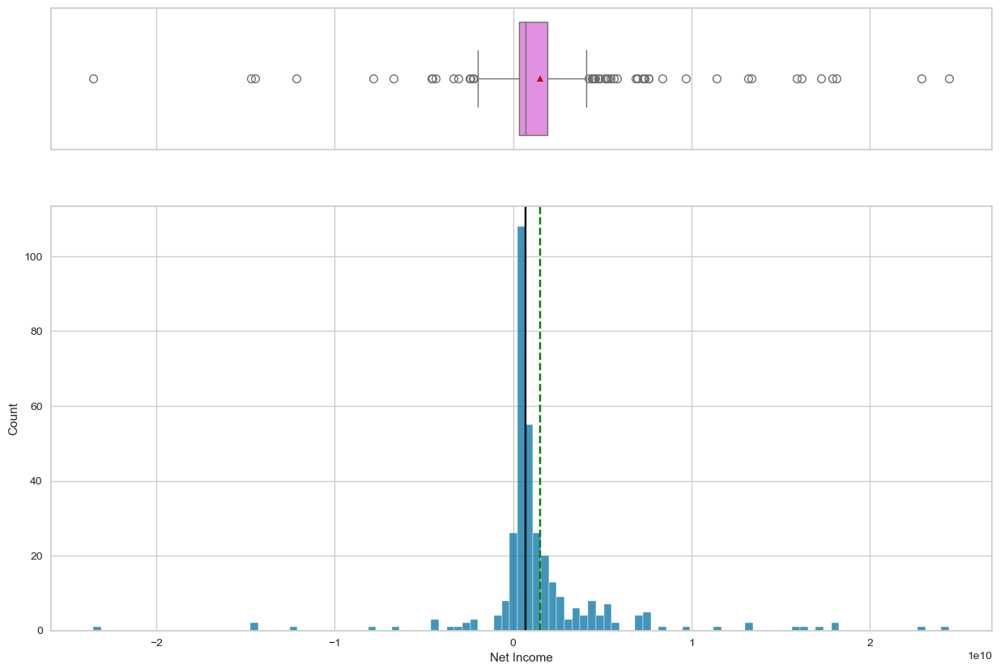

In [26]:
histogram_boxplot(df_stock_data, "Net Income")

**Net income is heavily right-skewed, with most companies reporting modest profits or losses and a few large outliers substantially boosting the mean. The close clustering near zero and significant spread of outliers reflect a wide disparity in profitability across firms**

**`Earnings Per Share`**

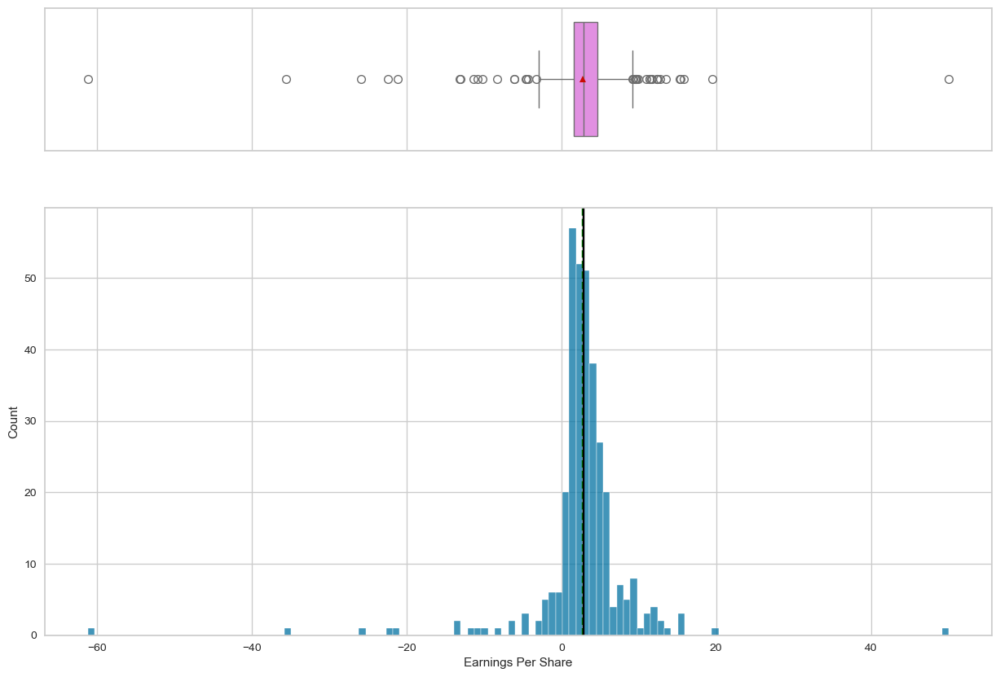

In [27]:
histogram_boxplot(df_stock_data, "Earnings Per Share")

**EPS is sharply right-skewed, with the majority of companies reporting small positive earnings and a few outliers with significantly high or negative values. The mean is slightly higher than the median, reflecting a handful of companies with extreme earnings that inflate the average**

**`Estimated Shares Outstanding`**

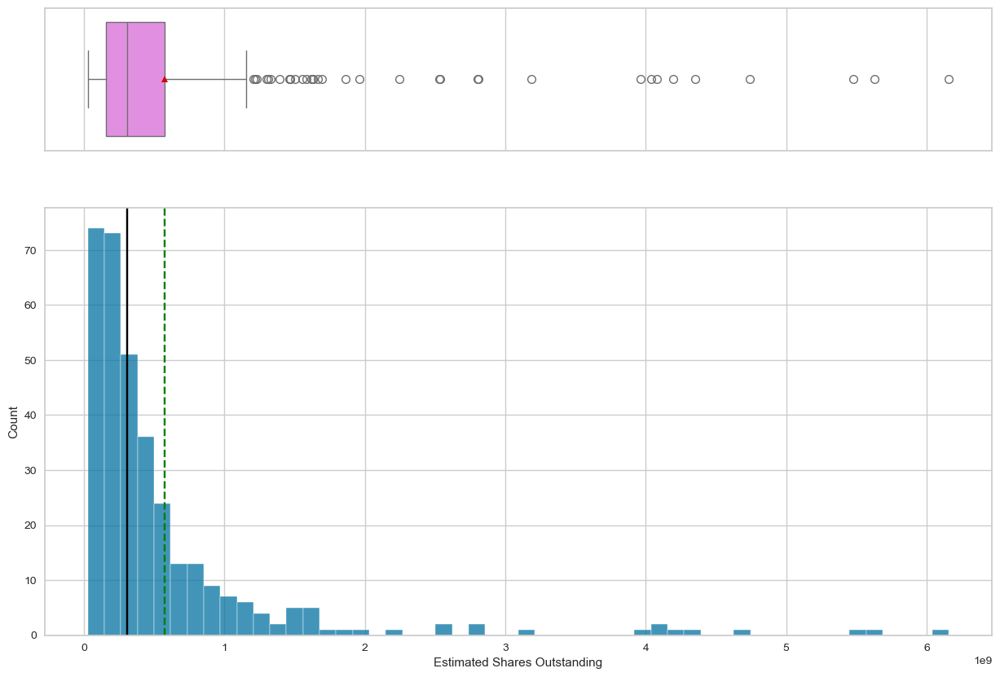

In [28]:
histogram_boxplot(df_stock_data, "Estimated Shares Outstanding")

**The number of estimated shares outstanding is right-skewed, with most companies having relatively lower share counts and a few large-cap firms issuing billions of shares. The median is significantly lower than the mean, highlighting how a small number of high-share companies distort the average.**

**`P/E Ratio`**

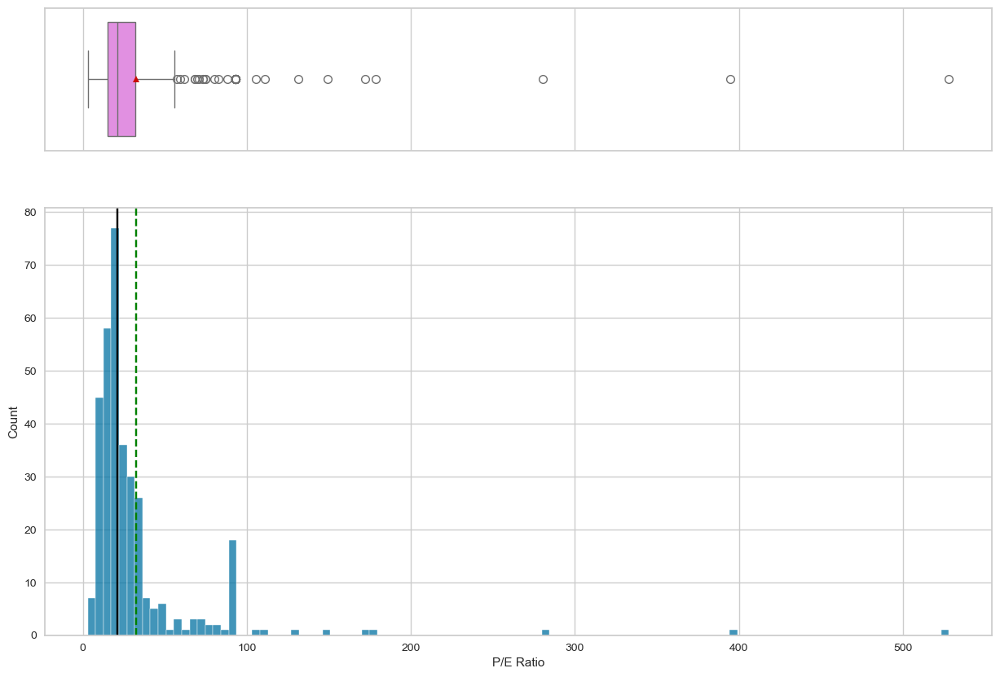

In [29]:
histogram_boxplot(df_stock_data, "P/E Ratio")

**The P/E ratio distribution is highly right-skewed, with most companies clustered under a value of 30. A small number of extremely high outliers significantly raise the mean, while the median remains much lower. This suggests that while most stocks are modestly valued relative to earnings, investor expectations for a few firms are exceptionally high.**

**`P/B Ratio`**

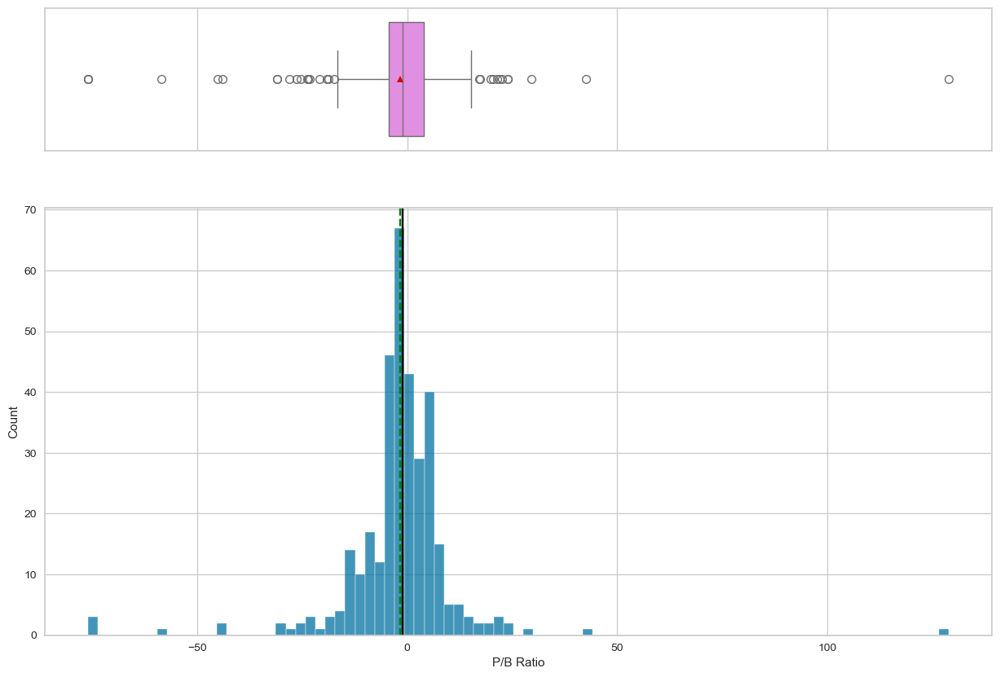

In [30]:
histogram_boxplot(df_stock_data, "P/B Ratio")

**The P/B ratio distribution is centered around zero with a tight cluster, but displays extreme outliers on both the negative and positive sides. While most firms have modest P/B ratios, the presence of negative values and extreme highs suggests accounting irregularities or market mispricing in select cases.**

**`Ticker Symbol`**

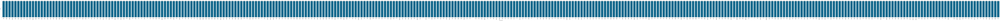

In [31]:
labeled_barplot(df_stock_data, "Ticker Symbol", perc=True)

In [32]:
df_stock_data["Ticker Symbol"].value_counts()

Ticker Symbol
AAL     1
NEE     1
NUE     1
NTRS    1
NSC     1
       ..
EQR     1
EQIX    1
EOG     1
EMN     1
ZTS     1
Name: count, Length: 340, dtype: int64

**`Security`**

In [33]:
df_stock_data["Security"].value_counts()

Security
American Airlines Group    1
NextEra Energy             1
Nucor Corp.                1
Northern Trust Corp.       1
Norfolk Southern Corp.     1
                          ..
Equity Residential         1
Equinix                    1
EOG Resources              1
Eastman Chemical           1
Zoetis                     1
Name: count, Length: 340, dtype: int64

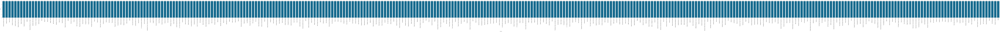

In [34]:
labeled_barplot(df_stock_data, "Security", perc=True)

**`GICS Sector`**

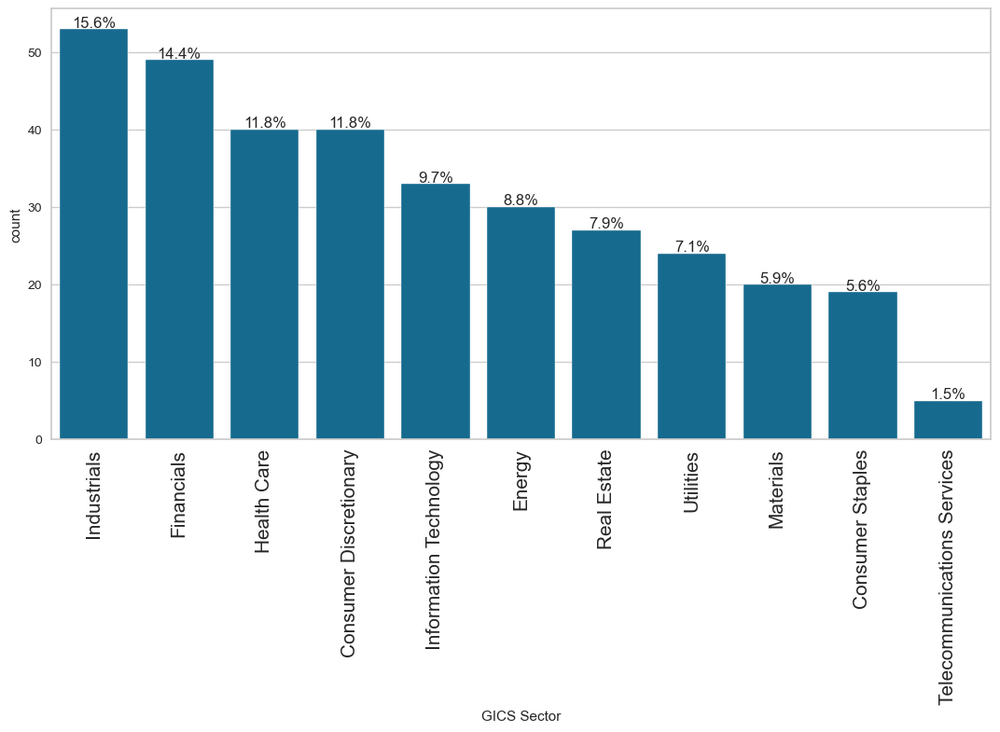

In [35]:
labeled_barplot(df_stock_data, "GICS Sector", perc=True)

**`GICS Sub Industry`** 

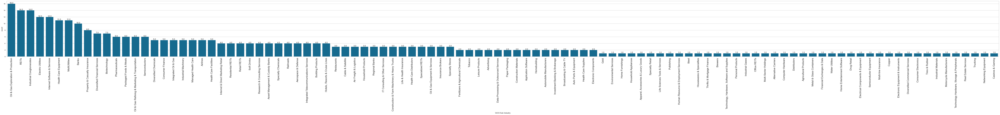

In [36]:
labeled_barplot(df_stock_data, "GICS Sub Industry")

### Key Insights from Univariate Analysis

1. **Stock Prices & Valuations**  
   Most stock prices and P/E ratios are low, but a few companies have very high values that raise the average. This means a small group of companies are priced much higher than the rest.

2. **Earnings & Profitability**  
   Most companies have small profits, while a few earn a lot. This causes the average EPS and net income to look higher than what most companies actually earn.

3. **Liquidity (Cash Ratio)**  
   Many companies hold enough cash to cover short-term needs, but a few hold very large cash reserves, pulling up the average.

4. **Volatility**  
   Volatility is mostly low to moderate. However, a few stocks are much more volatile, suggesting higher risk.

5. **Net Cash Flow**  
   Most companies have net cash flow near zero, with a few big positive or negative values — showing that some companies move a lot of cash.

6. **Shares Outstanding**  
   Most companies have fewer shares, but a few have issued in large numbers — these big firms impact the average a lot.


## Biivariate analysis

In [37]:
df_stock_data_attr = df_stock_data.iloc[:, 0:15]
print(df_stock_data_attr.dtypes)

Ticker Symbol                    object
Security                         object
GICS Sector                      object
GICS Sub Industry                object
Current Price                   float64
Price Change                    float64
Volatility                      float64
ROE                               int64
Cash Ratio                        int64
Net Cash Flow                     int64
Net Income                        int64
Earnings Per Share              float64
Estimated Shares Outstanding    float64
P/E Ratio                       float64
P/B Ratio                       float64
dtype: object


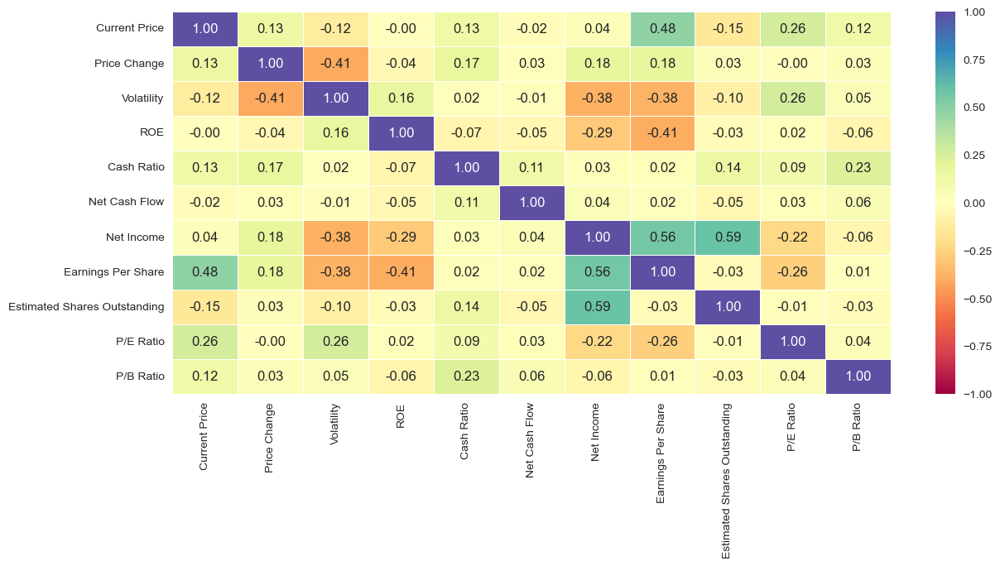

In [38]:
# create heatmap to understand correlation strength between all the x variables
num_cols = df_stock_data.select_dtypes(include=np.number).columns.tolist()

# Set larger figure size
plt.figure(figsize=(14, 6))

sns.heatmap(
    df_stock_data[num_cols].corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral", linewidths=0.5, linecolor='white'
)
plt.show()

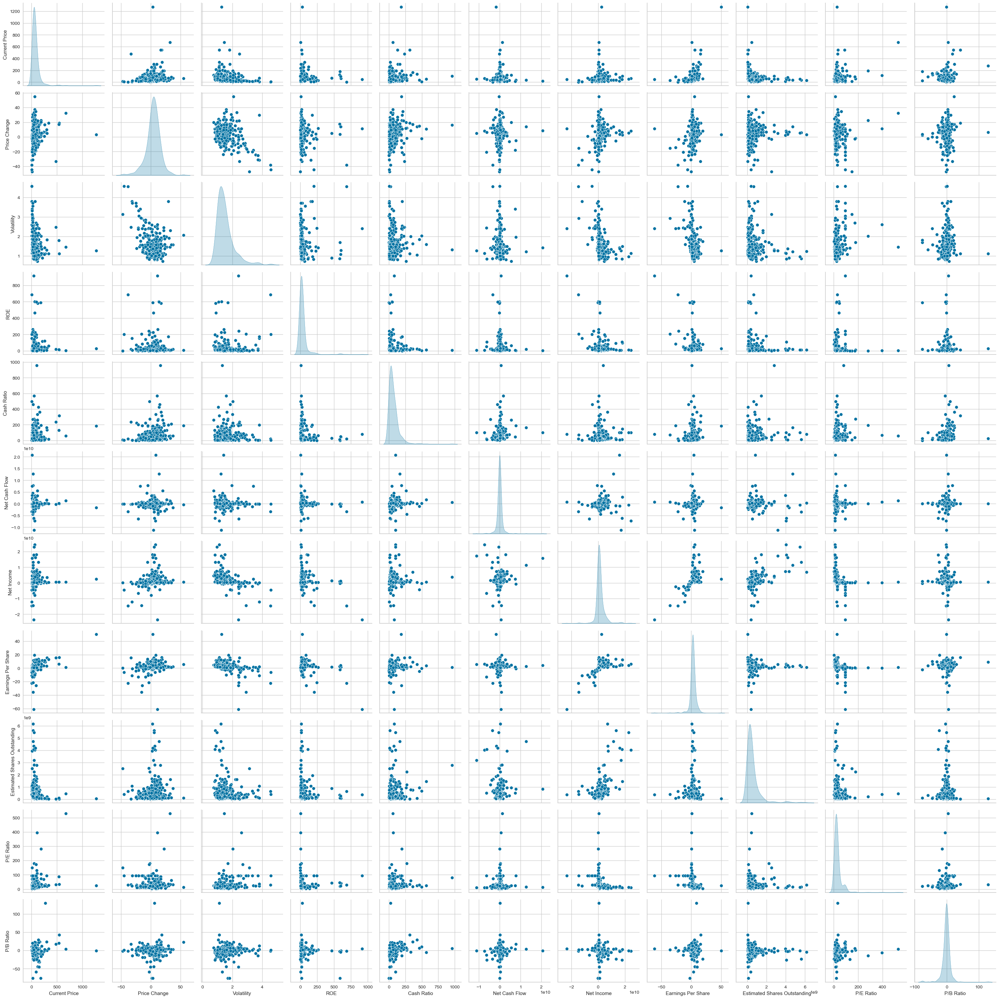

In [39]:
sns.pairplot(df_stock_data, diag_kind="kde", height=2.8)
plt.show()

### Summary: Key Correlation Insights

1. **EPS & Net Income** show the strongest positive relationship (**0.56**), which is expected since EPS is derived from net income.

2. **Net Income & Shares Outstanding** have a positive correlation (**0.59**), suggesting that larger companies tend to generate higher income.

3. **Volatility** is negatively correlated with both **EPS (-0.38)** and **Net Income (-0.38)**, indicating that more volatile stocks often have less stable earnings.

4. **P/E Ratio** shows weak correlations overall, but has a mild positive link with **Current Price (0.26)** and **Volatility (0.26)**, hinting at speculative valuation in more volatile stocks.

5. Most other relationships are weak, meaning many financial metrics move independently of one another.


## Data Preprocessing

- Duplicate value check
- Missing value treatment
- Outlier check
- Feature engineering (if needed)
- Any other preprocessing steps (if needed)

**Duplicate value check**

In [40]:
# check duplicates if any
df_stock_data.duplicated().sum()

0

**Missing value treatment**

In [41]:
# check missing values if any
df_stock_data.isnull().sum()

Ticker Symbol                   0
Security                        0
GICS Sector                     0
GICS Sub Industry               0
Current Price                   0
Price Change                    0
Volatility                      0
ROE                             0
Cash Ratio                      0
Net Cash Flow                   0
Net Income                      0
Earnings Per Share              0
Estimated Shares Outstanding    0
P/E Ratio                       0
P/B Ratio                       0
dtype: int64

**Sanity checks**
  -  There are no duplicates.
  -  There are no missing values, that means missing values treatment may not be required before building up the model

**Outlier check and Outlier detection and treatment (if needed)**

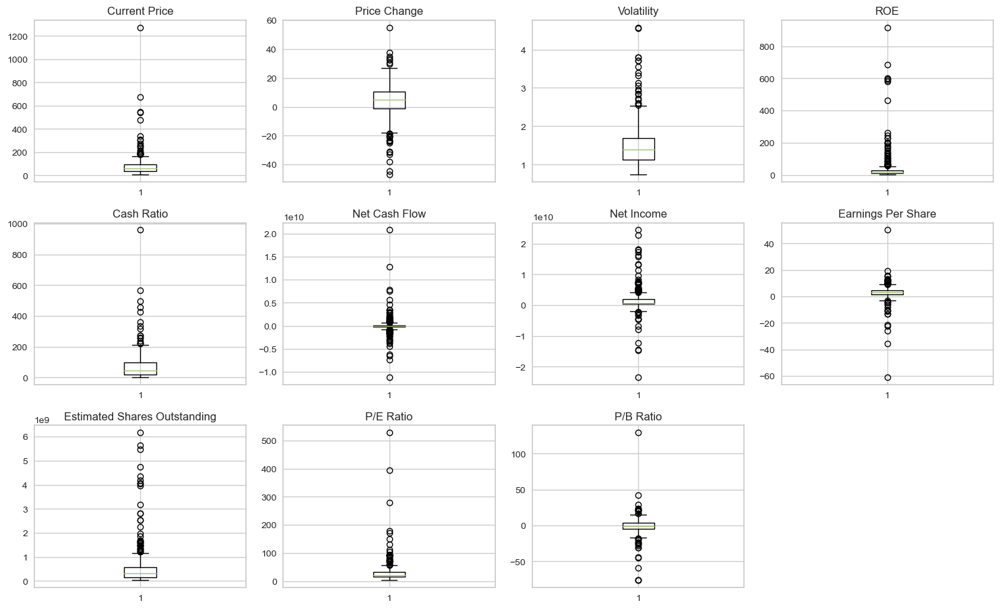

In [42]:
numeric_columns = df_stock_data.select_dtypes(include=np.number).columns.tolist()

plt.figure(figsize=(15, 12))

for i, variable in enumerate(numeric_columns):
    plt.subplot(4, 4, i + 1)
    plt.boxplot(df_stock_data[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

**Observation**

- ROE, Net Income, Net Cash Flow, P/E Ratio, Cash Ratio, and Estimated Shares Outstanding, which show extreme and frequent outliers.

- These outliers can skew averages, distort model performance, and affect interpretation.

**I prefer to** - IQR-based removal for analysis or modeling phases.

**Lets do Row Based IQR - treatment and analyze the data**

In [43]:
# Step 1: Copy the original DataFrame
df_stock_data_iqr_row_treatment = df_stock_data.copy()

# Step 2: Select only numeric columns
numeric_cols = df_stock_data_iqr_row_treatment.select_dtypes(include='number').columns

# Step 3: IQR-based outlier removal
for col in numeric_cols:
    Q1 = df_stock_data_iqr_row_treatment[col].quantile(0.25)
    Q3 = df_stock_data_iqr_row_treatment[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Filter the DataFrame to keep only non-outliers for this column
    df_stock_data_iqr_row_treatment = df_stock_data_iqr_row_treatment[(df_stock_data_iqr_row_treatment[col] >= lower_bound) & (df_stock_data_iqr_row_treatment[col] <= upper_bound)]

# Step 4: Done — df_cleaned now holds the filtered data
print("Shape before outlier removal:", df_stock_data.shape)
print("Shape after outlier removal: IQR Row Treatment", df_stock_data_iqr_row_treatment.shape)


Shape before outlier removal: (340, 15)
Shape after outlier removal: IQR Row Treatment (127, 15)


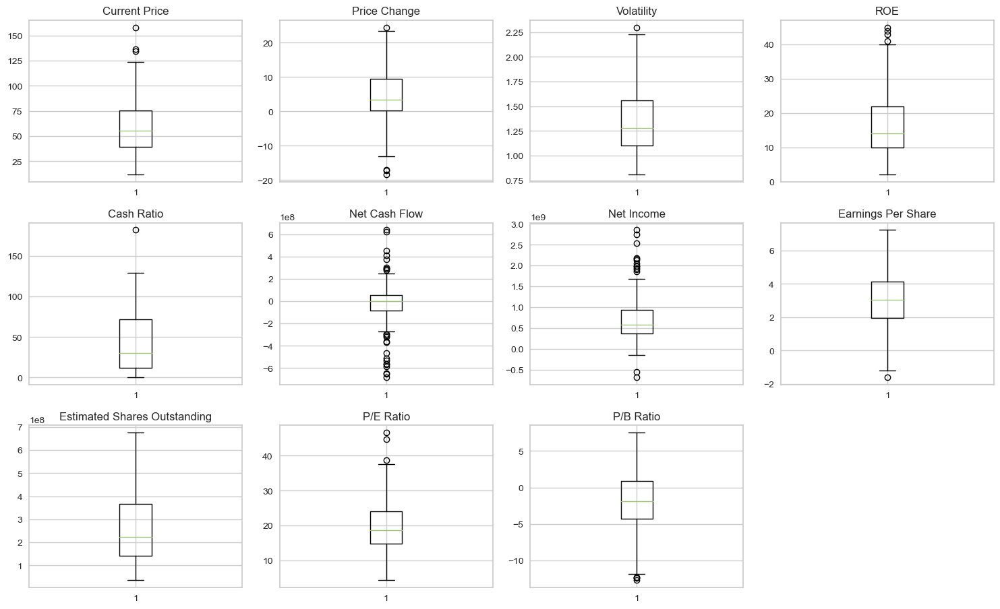

In [44]:
numeric_columns = df_stock_data_iqr_row_treatment.select_dtypes(include=np.number).columns.tolist()

plt.figure(figsize=(15, 12))

for i, variable in enumerate(numeric_columns):
    plt.subplot(4, 4, i + 1)
    plt.boxplot(df_stock_data_iqr_row_treatment[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

**Lets do Column Based IQR - treatment and analyze the data**

In [45]:
# Step 1: Copy the original DataFrame
df_stock_data_iqr_column_treatment = df_stock_data.copy()

# Step 2: Select numeric columns
numeric_cols = df_stock_data_iqr_column_treatment.select_dtypes(include='number').columns

# Step 3: Apply IQR filtering column by column
for col in numeric_cols:
    Q1 = df_stock_data_iqr_column_treatment[col].quantile(0.25)
    Q3 = df_stock_data_iqr_column_treatment[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Replace outliers with NaN (can impute or drop later)
    df_stock_data_iqr_column_treatment[col] = df_stock_data_iqr_column_treatment[col].where((df_stock_data_iqr_column_treatment[col] >= lower_bound) & (df_stock_data_iqr_column_treatment[col] <= upper_bound))

# Step 4: Report how many values were replaced
print("Number of NaNs after column-wise outlier treatment:\n")
print(df_stock_data_iqr_column_treatment.isna().sum())
print("Shape before outlier removal:", df_stock_data.shape)
print("Shape after outlier removal: IQR Column Treatment", df_stock_data_iqr_column_treatment.shape)

Number of NaNs after column-wise outlier treatment:

Ticker Symbol                    0
Security                         0
GICS Sector                      0
GICS Sub Industry                0
Current Price                   22
Price Change                    23
Volatility                      20
ROE                             39
Cash Ratio                      16
Net Cash Flow                   76
Net Income                      57
Earnings Per Share              39
Estimated Shares Outstanding    35
P/E Ratio                       41
P/B Ratio                       30
dtype: int64
Shape before outlier removal: (340, 15)
Shape after outlier removal: IQR Column Treatment (340, 15)


**Lets impute NaNs**

- Median: non-normal distributions (e.g., ROE, Net Income, P/E Ratio)
- Mean: symmetric distributions (e.g., Volatility, Price Change if close to normal)

In [46]:
# Step 1: Copy the irq_column_treatment DataFrame
df_stock_data_iqr_column_imputed = df_stock_data_iqr_column_treatment.copy()

# Step 2: Impute each numeric column appropriately
for col in df_stock_data_iqr_column_imputed.select_dtypes(include='number').columns:
    if abs(df_stock_data_iqr_column_imputed[col].skew()) > 1:
        # Highly skewed → use median
        impute_value = df_stock_data_iqr_column_imputed[col].median()
    else:
        # Normal or mildly skewed → use mean
        impute_value = df_stock_data_iqr_column_imputed[col].mean()
    
    # Fill NaN with the chosen value
    df_stock_data_iqr_column_imputed[col].fillna(impute_value, inplace=True)

# Step 3: Verify no NaNs remain
print("Remaining NaNs after imputation:")
print(df_stock_data_iqr_column_imputed.isna().sum())
print("Shape after outlier removal: IQR Column Treatment and Imputating NaNs", df_stock_data_iqr_column_imputed.shape)


Remaining NaNs after imputation:
Ticker Symbol                   0
Security                        0
GICS Sector                     0
GICS Sub Industry               0
Current Price                   0
Price Change                    0
Volatility                      0
ROE                             0
Cash Ratio                      0
Net Cash Flow                   0
Net Income                      0
Earnings Per Share              0
Estimated Shares Outstanding    0
P/E Ratio                       0
P/B Ratio                       0
dtype: int64
Shape after outlier removal: IQR Column Treatment and Imputating NaNs (340, 15)


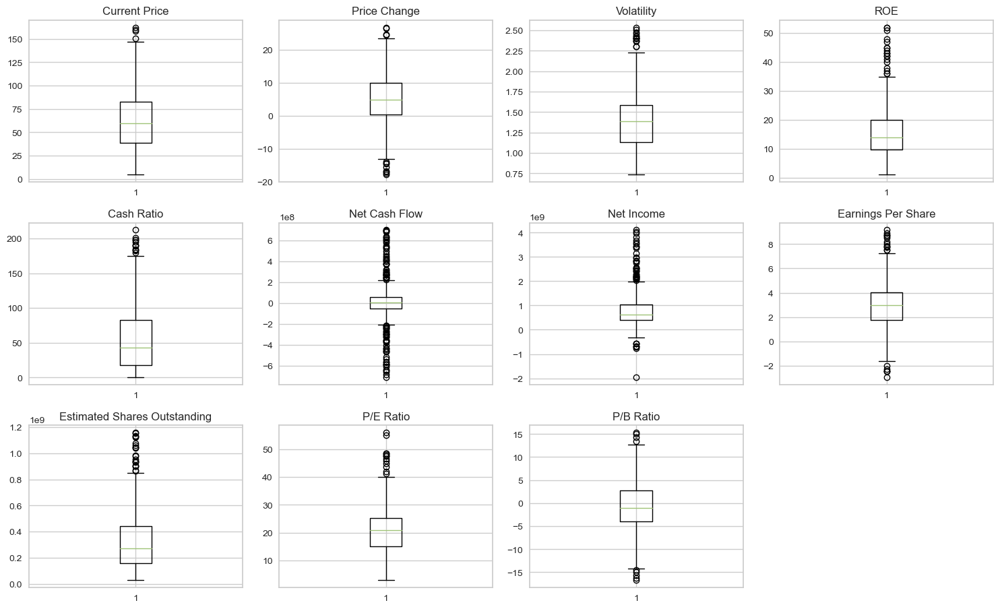

In [47]:
numeric_columns = df_stock_data_iqr_column_imputed.select_dtypes(include=np.number).columns.tolist()

plt.figure(figsize=(15, 12))

for i, variable in enumerate(numeric_columns):
    plt.subplot(4, 4, i + 1)
    plt.boxplot(df_stock_data_iqr_column_imputed[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

**Observation**

**The data is correctly treated**

**Row-based IQR removal: removes any row with just one outlier → big data loss**
- Not good due to data loss - almost 60%. 

**Column-wise IQR + Imputation:**
- Outliers were replaced with NaN
- Missing values imputed based on skew (mean or median)
- Keeps all rows
- Only fixes the specific outlier values
- Preserves patterns and improves model generalizability
- You avoided over-cleaning the data
- You still addressed extreme values
- You now have a robust and usable dataset for modeling or analysis
  


**Visualization - Why still the outliers?** 

The remaining outliers I see in the boxplots:

- Are not errors
- Reflect the natural shape of financial data — which often has long tails, even after treatment
- May also include mild outliers that are still within 1.5×IQR range but visually marked as circles in boxplots




## EDA

- It is a good idea to explore the data once again after manipulating it.

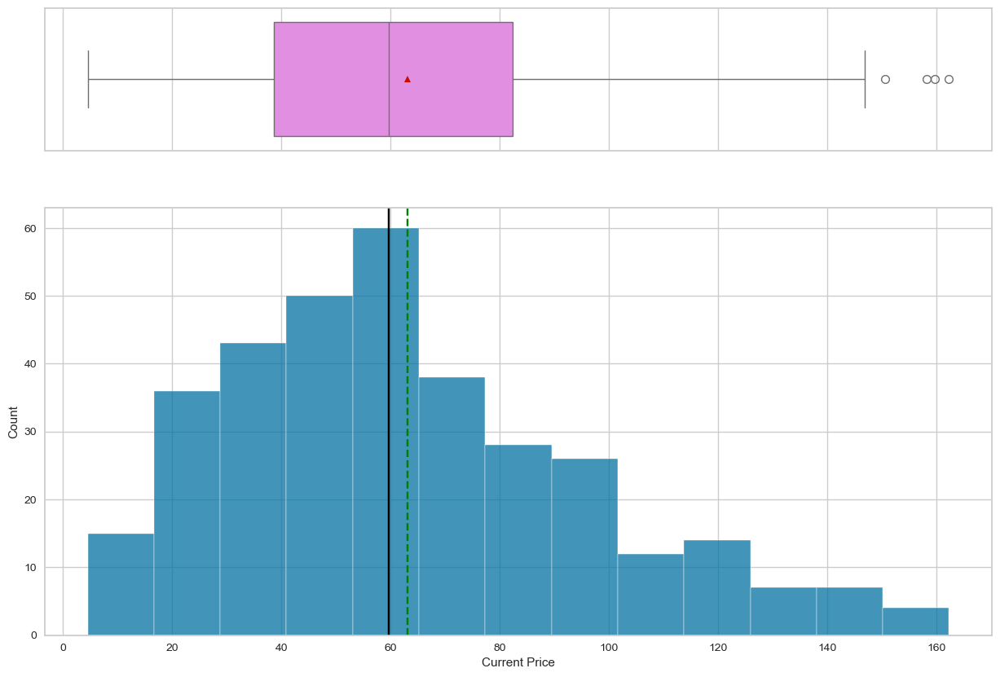

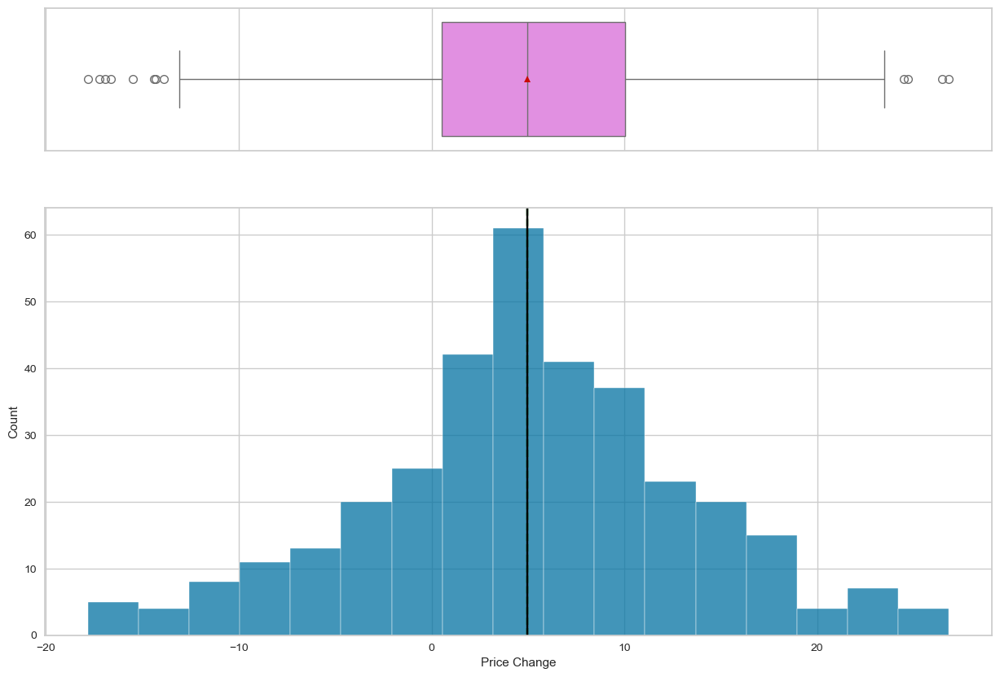

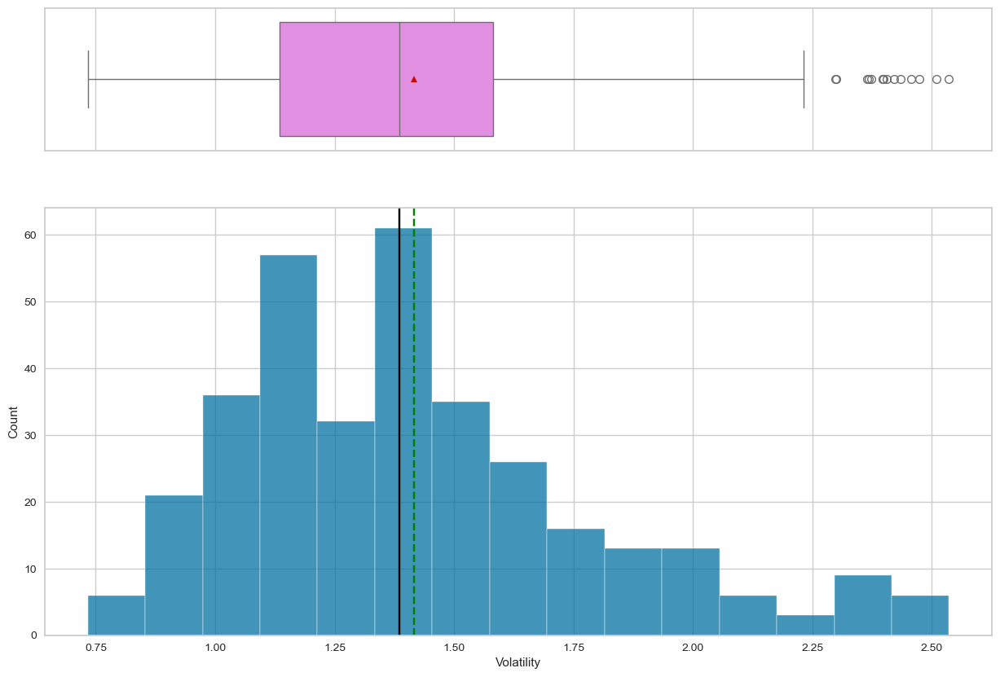

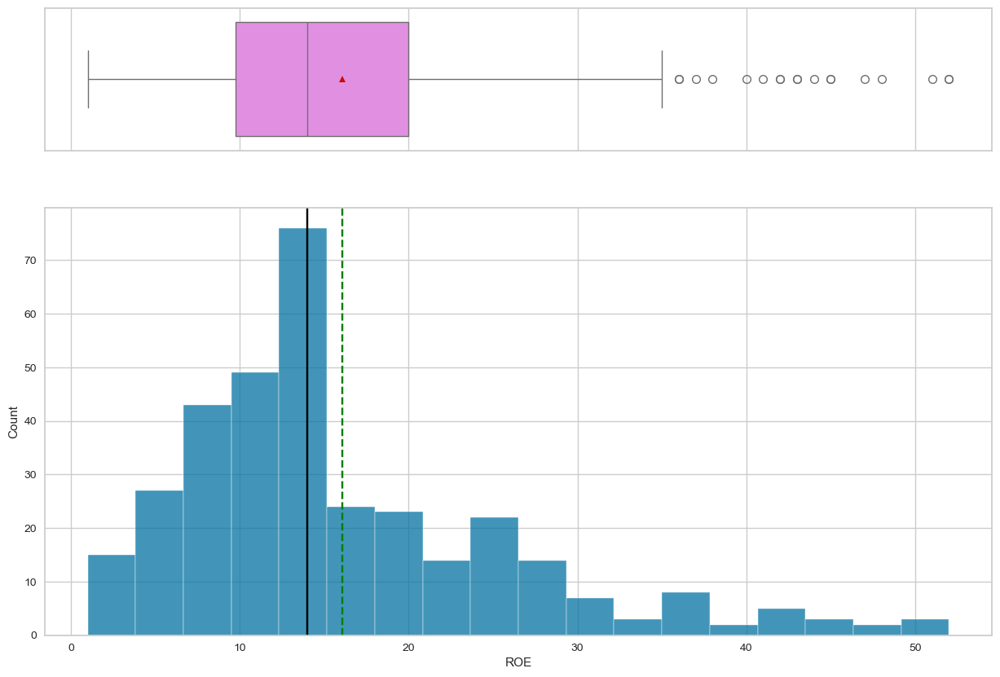

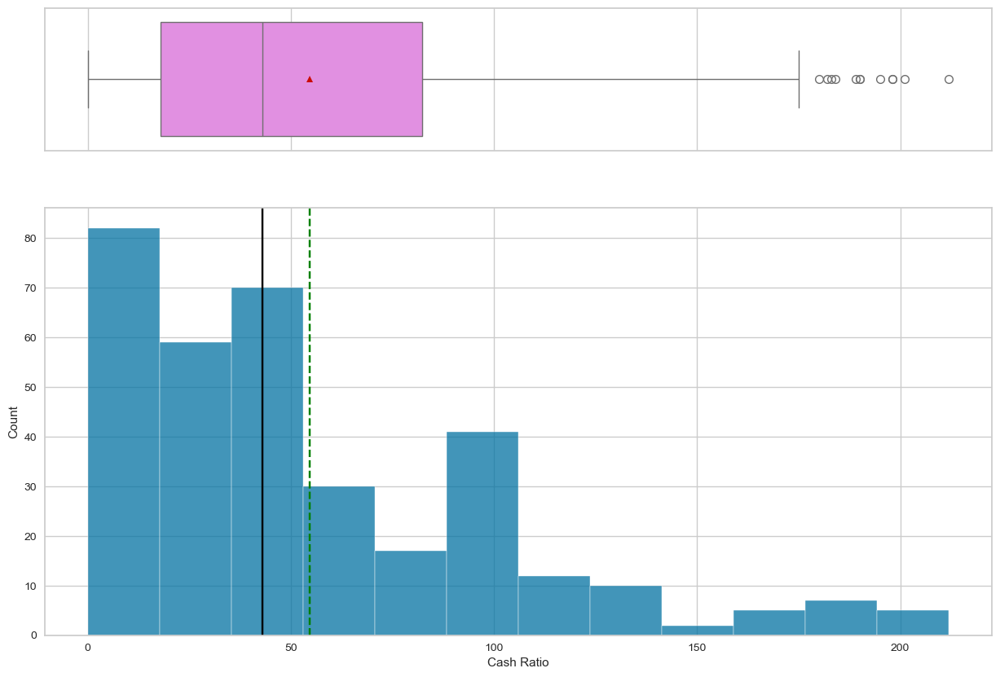

...

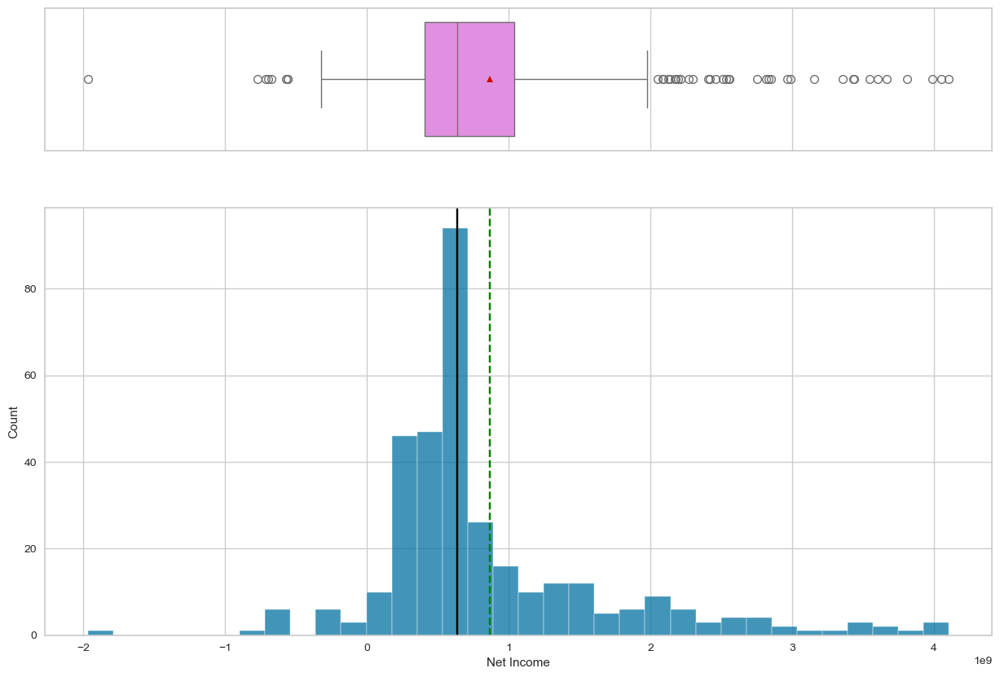

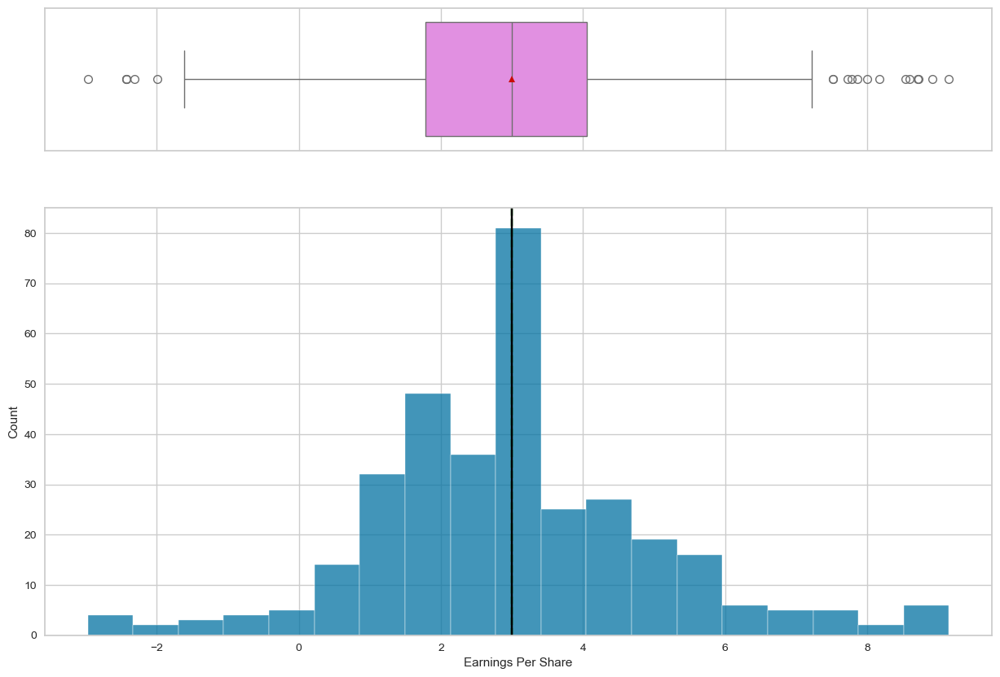

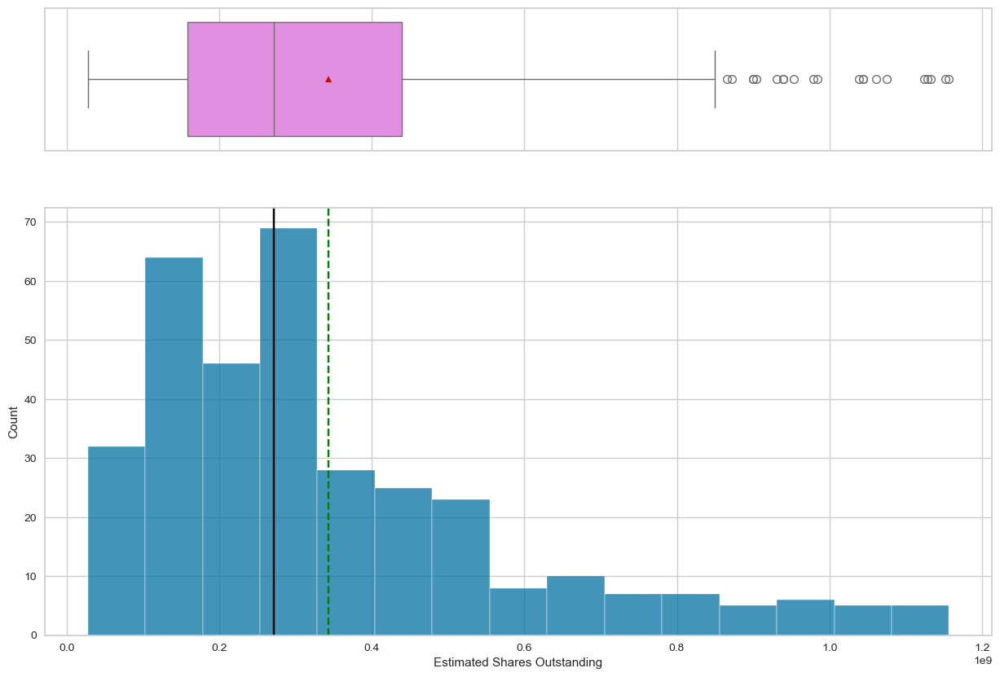

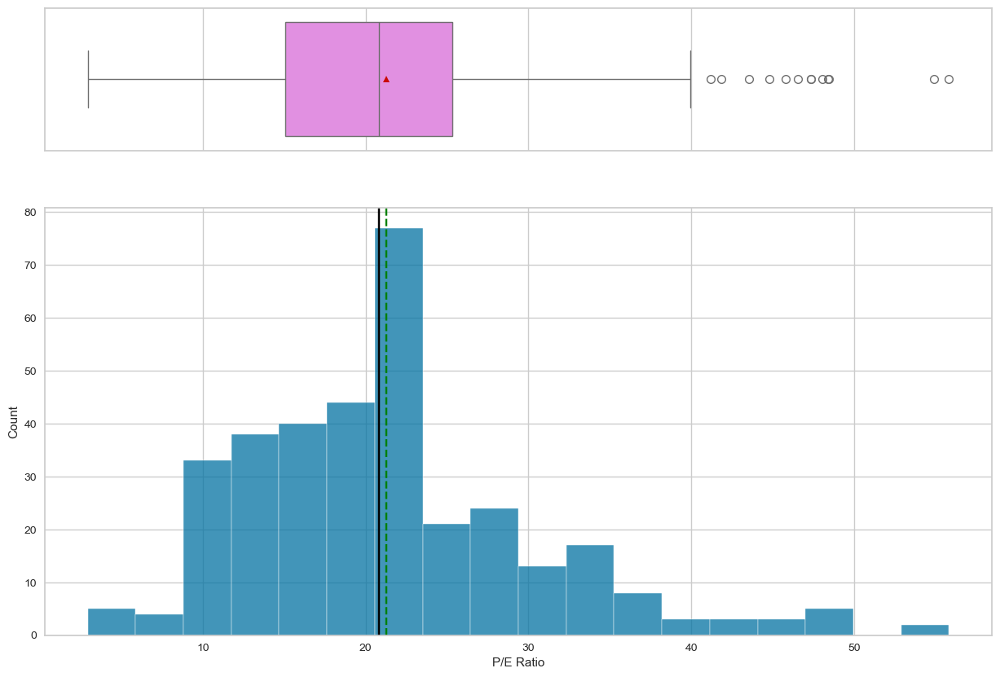

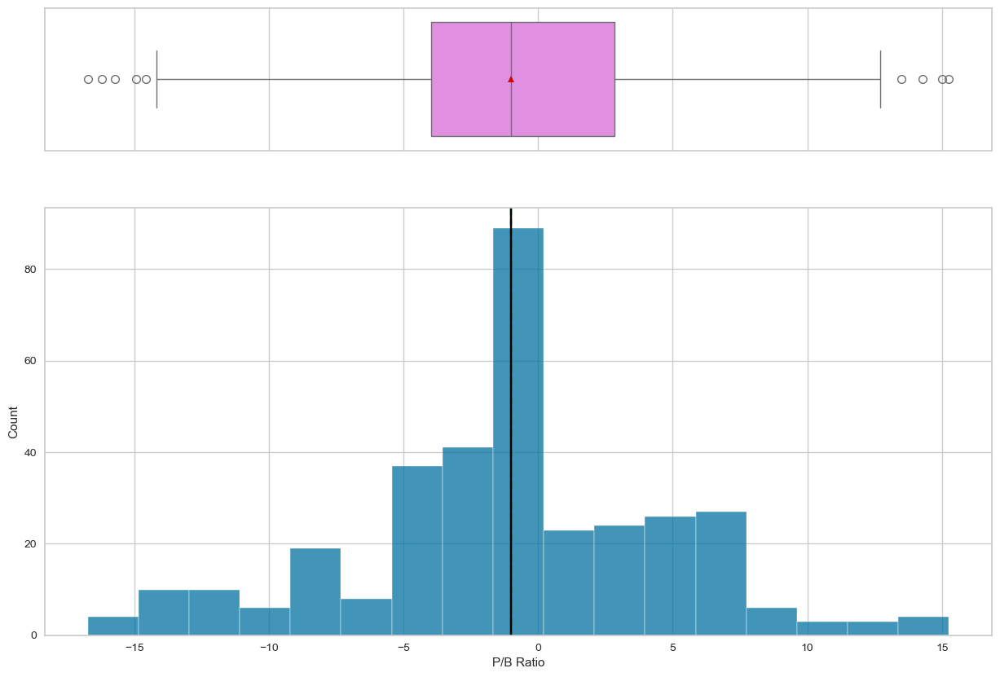

In [48]:
histogram_boxplot(df_stock_data_iqr_column_imputed, "Current Price")
histogram_boxplot(df_stock_data_iqr_column_imputed, "Price Change")
histogram_boxplot(df_stock_data_iqr_column_imputed, "Volatility")
histogram_boxplot(df_stock_data_iqr_column_imputed, "ROE")
histogram_boxplot(df_stock_data_iqr_column_imputed, "Cash Ratio")
histogram_boxplot(df_stock_data_iqr_column_imputed, "Net Cash Flow")
histogram_boxplot(df_stock_data_iqr_column_imputed, "Net Income")
histogram_boxplot(df_stock_data_iqr_column_imputed, "Earnings Per Share")
histogram_boxplot(df_stock_data_iqr_column_imputed, "Estimated Shares Outstanding")
histogram_boxplot(df_stock_data_iqr_column_imputed, "P/E Ratio")
histogram_boxplot(df_stock_data_iqr_column_imputed, "P/B Ratio")

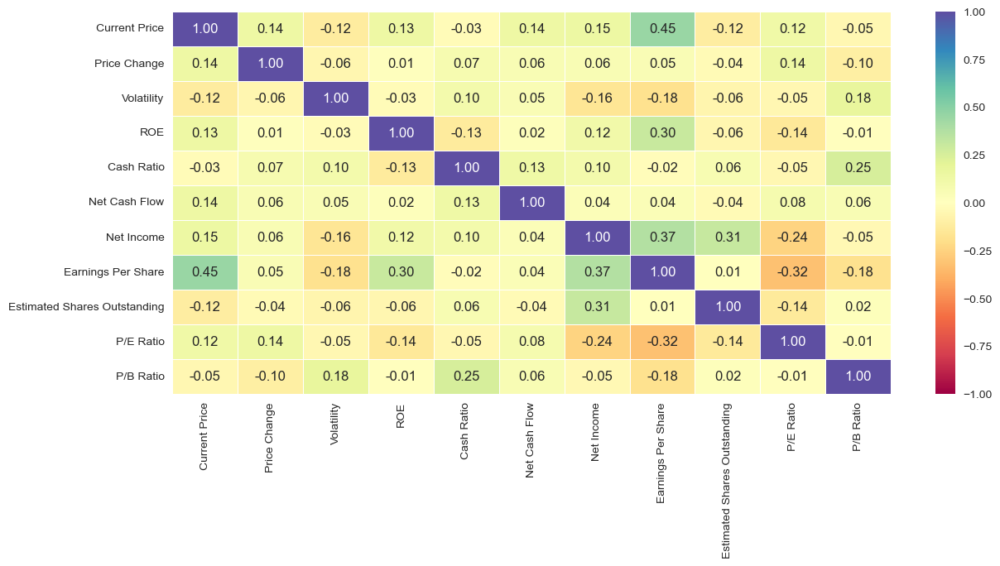

In [49]:
# create heatmap to understand correlation strength between all the x variables
num_cols = df_stock_data_iqr_column_imputed.select_dtypes(include=np.number).columns.tolist()

# Set larger figure size
plt.figure(figsize=(14, 6))

sns.heatmap(
    df_stock_data_iqr_column_imputed[num_cols].corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral", linewidths=0.5, linecolor='white'
)
plt.show()

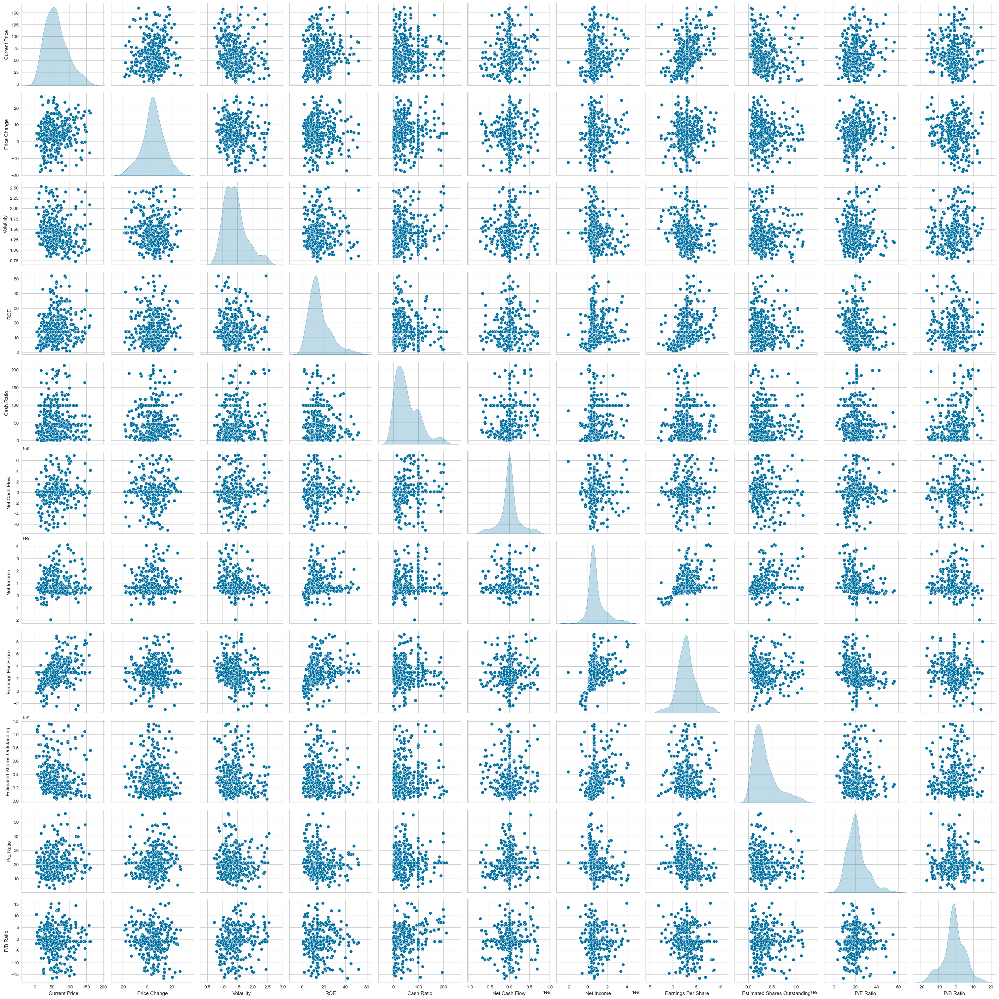

In [50]:
sns.pairplot(df_stock_data_iqr_column_imputed, diag_kind="kde", height=2.8)
plt.show()

### Correlation Comparison: Before vs After Imputation

After performing column-wise outlier treatment and imputing missing values, I observed some changes in the correlation matrix. Below is a summary of key differences:

| Feature Pair                        | Before Imputation | After Imputation | Change         |
|------------------------------------|--------------------|------------------|----------------|
| **Earnings Per Share & Net Income**           | 0.56               | 0.37             | Lower        |
| **Earnings Per Share & Current Price**        | 0.48               | 0.45             | Slight        |
| **Earnings Per Share & Shares Outstanding**   | -0.03              | -0.32            | Noticeable    |
| **Net Income & Shares Outstanding**           | 0.59               | 0.30             | Lower        |
| **Volatility & Earnings Per Share**           | -0.38              | -0.18            | Weaker        |
| **ROE & Earnings Per Share**                  | -0.41              | -0.14            | Much Weaker   |

---

### Interpretation:

- Correlations have **weakened** slightly after imputation because extreme values (outliers) were smoothed.
- Imputed values (mean or median) reduce variability and contrast, which leads to **lower correlation values**.
- This is expected and acceptable, especially when preparing data for modeling.

---

### Conclusion:

The changes reflect a **more stable and cleaner dataset** that is less sensitive to outliers. While some strong relationships are now weaker, the data is now better suited for reliable analysis and modeling.


## K-means Clustering

In [51]:
df_stock_data_iqr_column_imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 340 entries, 0 to 339
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Ticker Symbol                 340 non-null    object 
 1   Security                      340 non-null    object 
 2   GICS Sector                   340 non-null    object 
 3   GICS Sub Industry             340 non-null    object 
 4   Current Price                 340 non-null    float64
 5   Price Change                  340 non-null    float64
 6   Volatility                    340 non-null    float64
 7   ROE                           340 non-null    float64
 8   Cash Ratio                    340 non-null    float64
 9   Net Cash Flow                 340 non-null    float64
 10  Net Income                    340 non-null    float64
 11  Earnings Per Share            340 non-null    float64
 12  Estimated Shares Outstanding  340 non-null    float64
 13  P/E R

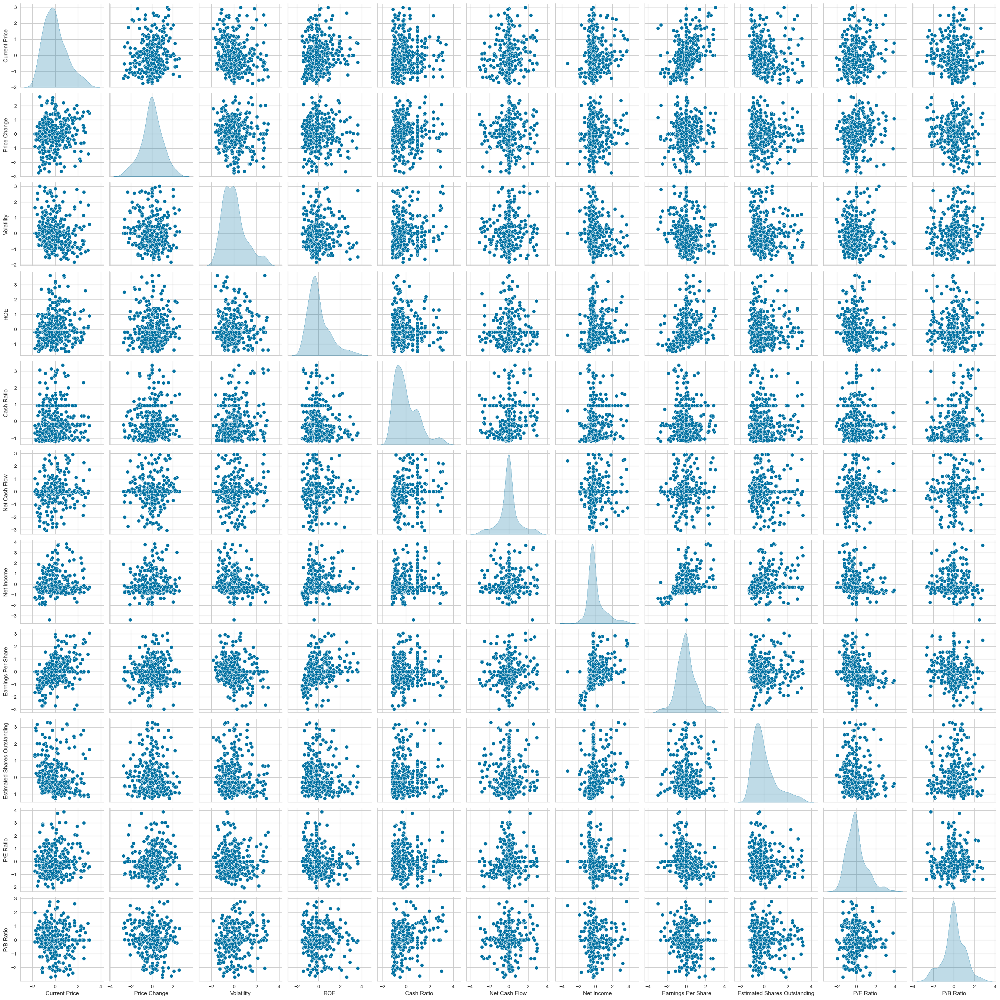

In [52]:
# Step 1: Select only the numeric columns
df_stock_data_numeric = df_stock_data_iqr_column_imputed.select_dtypes(include='number')

# Step 2: Initialize the scaler and fit-transform the data
scaler = StandardScaler()
scaled_array = scaler.fit_transform(df_stock_data_numeric)

# Step 3: Convert back to DataFrame with same column names
df_stock_data_scaled = pd.DataFrame(scaled_array, columns=df_stock_data_numeric.columns)

# Step 4: Visualize with pairplot
sns.pairplot(df_stock_data_scaled, diag_kind='kde')
plt.show()

**Elbow Plot**

In [53]:
# Use the scaled dataset
df_k_means_stock_data = df_stock_data_scaled.copy()

Number of Clusters: 1	Average Distortion: 3.1868
Number of Clusters: 2	Average Distortion: 2.9876
Number of Clusters: 3	Average Distortion: 2.8684
Number of Clusters: 4	Average Distortion: 2.7687
Number of Clusters: 5	Average Distortion: 2.6920
Number of Clusters: 6	Average Distortion: 2.6277
Number of Clusters: 7	Average Distortion: 2.5738
Number of Clusters: 8	Average Distortion: 2.5335
Number of Clusters: 9	Average Distortion: 2.4921
Number of Clusters: 10	Average Distortion: 2.4557
Number of Clusters: 11	Average Distortion: 2.4146
Number of Clusters: 12	Average Distortion: 2.3846
Number of Clusters: 13	Average Distortion: 2.3612
Number of Clusters: 14	Average Distortion: 2.3107


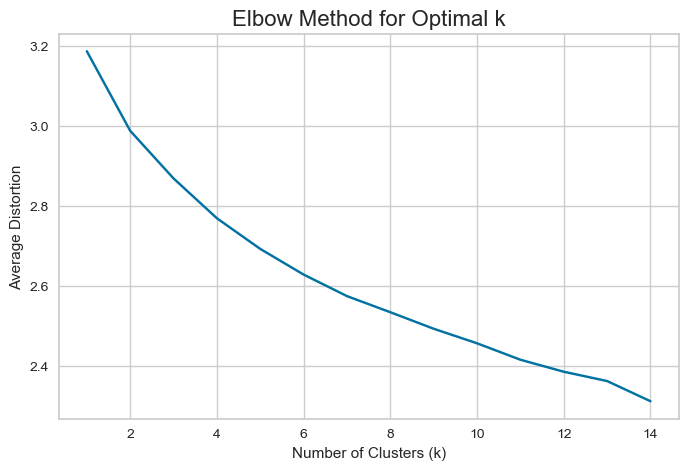

In [54]:
clusters = range(1, 15)
meanDistortions = []

for k in clusters:
    model = KMeans(n_clusters=k, random_state=1)
    model.fit(df_k_means_stock_data)
    
    # Calculate average distortion (inertia alternative)
    distortion = sum(
        np.min(
            cdist(df_k_means_stock_data, model.cluster_centers_, "euclidean"), axis=1
        )
    ) / df_k_means_stock_data.shape[0]
    
    meanDistortions.append(distortion)
    print(f"Number of Clusters: {k}\tAverage Distortion: {distortion:.4f}")

# Plot the elbow
plt.figure(figsize=(8, 5))
plt.plot(clusters, meanDistortions, "bx-")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Average Distortion")
plt.title("Elbow Method for Optimal k", fontsize=16)
plt.grid(True)
plt.show()


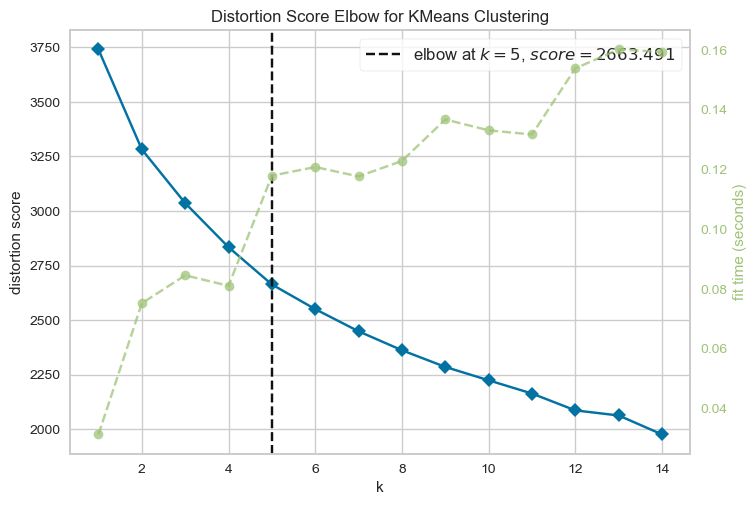

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [55]:
model = KMeans(random_state=1)
visualizer = KElbowVisualizer(model, k=(1, 15), timings=True)
visualizer.fit(df_k_means_stock_data)  # fit the data to the visualizer
visualizer.show()  # finalize and render figure

### Elbow Plot Interpretation

The Elbow Plot helps determine the optimal number of clusters (`k`) for K-Means clustering by identifying where the average distortion (within-cluster distance) stops decreasing significantly.

#### Key Observations:
- The average distortion decreases steeply from **k = 1 to k = 3**
- The curve starts to **flatten noticeably around k = 4**
- Beyond **k = 4 or 5**, the improvement in distortion becomes marginal

#### Conclusion:
- The **optimal number of clusters is likely 4**
- **k = 5** may be considered if slightly more granularity is needed

#### Next Step:
I think I can proceed with **k = 5** as the optimal cluster count for balanced segmentation and interpretability.


**silhouette scores**

Silhouette Score for k=2: 0.1168
Silhouette Score for k=3: 0.0957
Silhouette Score for k=4: 0.0935
Silhouette Score for k=5: 0.0972
Silhouette Score for k=6: 0.0804
Silhouette Score for k=7: 0.0874
Silhouette Score for k=8: 0.1033
Silhouette Score for k=9: 0.0970
Silhouette Score for k=10: 0.0951
Silhouette Score for k=11: 0.0868
Silhouette Score for k=12: 0.1002
Silhouette Score for k=13: 0.0906
Silhouette Score for k=14: 0.0994


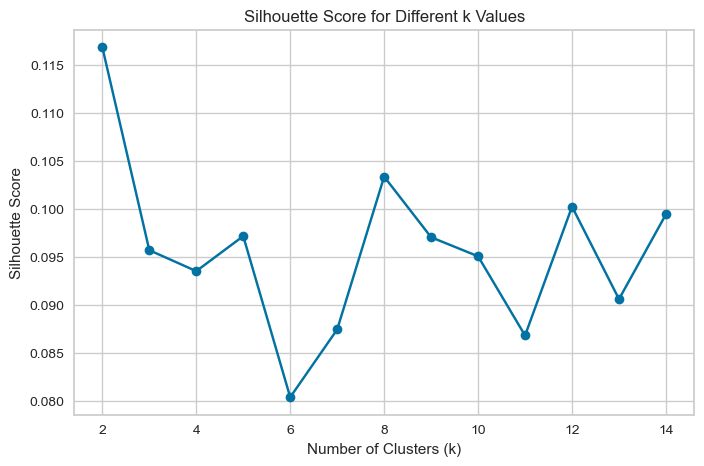

In [56]:
# List of cluster counts to try
cluster_list = list(range(2, 15))
sil_scores = []

# Calculate silhouette score for each k
for k in cluster_list:
    model = KMeans(n_clusters=k, random_state=1)
    preds = model.fit_predict(df_k_means_stock_data)
    score = silhouette_score(df_k_means_stock_data, preds)
    sil_scores.append(score)
    print(f"Silhouette Score for k={k}: {score:.4f}")

# Plot the silhouette scores
plt.figure(figsize=(8, 5))
plt.plot(cluster_list, sil_scores, 'bo-')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score for Different k Values")
plt.grid(True)
plt.show()

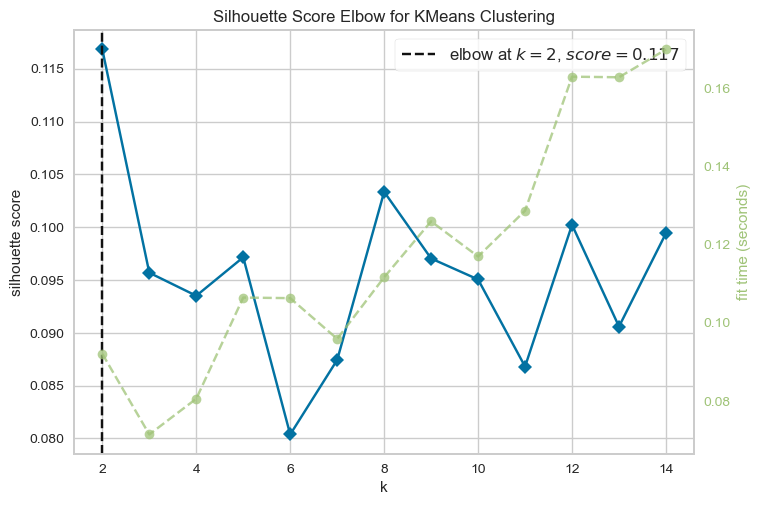

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [57]:
model = KMeans(random_state=1)
visualizer = KElbowVisualizer(model, k=(2, 15), metric="silhouette", timings=True)
visualizer.fit(df_k_means_stock_data)  # fit the data to the visualizer
visualizer.show()  # finalize and render figure

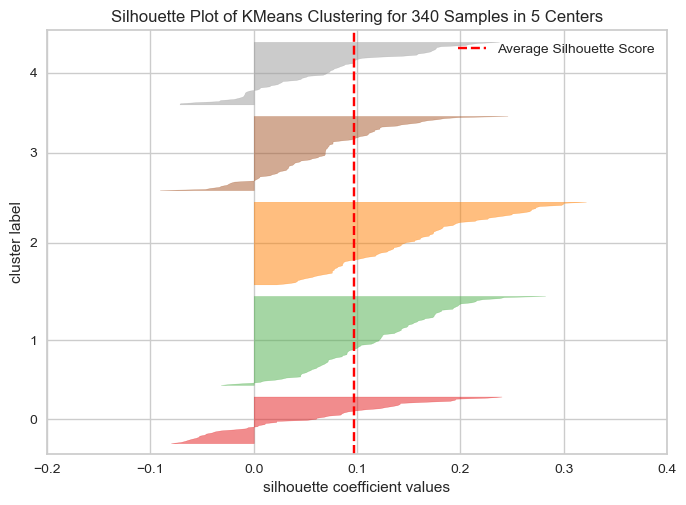

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 340 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [58]:
# Visualize silhouette scores for a fixed number of clusters, e.g., k = 5
visualizer = SilhouetteVisualizer(KMeans(n_clusters=5, random_state=1))
visualizer.fit(df_k_means_stock_data)  # scaled input data
visualizer.show()

### Clustering Evaluation Summary (Elbow + Silhouette Analysis)

I've applied both the **Elbow Method** and **Silhouette Analysis** to determine the optimal number of clusters for KMeans. Here's what I observed:

---

### 1. Elbow Plot (Distortion Score)
- Shows a clear **elbow point at `k = 5`**, meaning:
  - After `k = 5`, the reduction in distortion slows down.
  - Adding more clusters offers **diminishing returns**.
---

### 2. Silhouette Score Plot
- The **highest silhouette score** is at **k = 2** (~0.117), but:
  - It may **oversimplify the data** by forcing it into just 2 broad clusters.
  - Useful patterns and segmentation might be lost with such low granularity.
- Scores for **k = 5 to 8** are slightly lower but still stable and acceptable.

---

### 3. Silhouette Visualizer (k = 5)
- All 5 clusters have mostly **positive silhouette coefficients**, indicating good separation.
- A few points in some clusters fall slightly below zero → minor overlap, but not concerning.
- Cluster sizes vary (some bigger than others), which is typical in financial datasets.

---

### Final Recommendation based on the analysis:
- Use **k = 5** for KMeans clustering.
- It strikes the right balance between:
  - **Compactness (low distortion)**
  - **Separation (decent silhouette)**
  - **Interpretability (enough detail without too much noise)**

---



### **Creating Final Model**

In [59]:
# final K-means model
kmeans = KMeans(n_clusters=5, random_state=1)  ## Complete the code to choose the number of clusters
kmeans.fit(df_k_means_stock_data)

KMeans(n_clusters=5, random_state=1)

In [60]:
# Create a copy of the original (non-scaled) data
df_stock_data_copy = df_stock_data.copy()

# Add cluster labels to both original and scaled DataFrames
df_stock_data_copy["KM_segments"] = kmeans.labels_ # original data
df_k_means_stock_data["KM_segments"] = kmeans.labels_ # scaled data


In [61]:
df_stock_data_copy[["Ticker Symbol", "Security", "GICS Sector", "KM_segments"]].head(10)

,Ticker Symbol,Security,GICS Sector,KM_segments
0,AAL,American Airlines Group,Industrials,1
1,ABBV,AbbVie,Health Care,0
2,ABT,Abbott Laboratories,Health Care,1
3,ADBE,Adobe Systems Inc,Information Technology,0
4,ADI,"Analog Devices, Inc.",Information Technology,1
5,ADM,Archer-Daniels-Midland Co,Consumer Staples,4
6,ADS,Alliance Data Systems,Information Technology,3
7,AEE,Ameren Corp,Utilities,1
8,AEP,American Electric Power,Utilities,4
9,AFL,AFLAC Inc,Financials,4


In [62]:
# Group by cluster and summarize selected columns
selected_features = [
    "Current Price", "ROE", "Cash Ratio", "Net Income", 
    "Earnings Per Share", "P/E Ratio", "Volatility"
]

cluster_summary = df_stock_data_copy.groupby("KM_segments")[selected_features].mean().round(2)

# Add cluster sizes
cluster_sizes = df_stock_data_copy["KM_segments"].value_counts().sort_index()
cluster_summary["Cluster Size"] = cluster_sizes

# Display the summary
cluster_summary


,Current Price,ROE,Cash Ratio,Net Income,Earnings Per Share,P/E Ratio,Volatility,Cluster Size
KM_segments,,,,,,,,
0,104.84,48.73,132.91,1.018762e+09,1.20,44.49,1.74,45
1,47.32,46.34,56.74,3.866723e+08,0.20,38.67,1.85,85
2,93.68,46.51,57.35,1.095473e+09,2.76,42.33,1.32,79
3,96.03,29.80,44.27,2.129583e+09,4.97,19.77,1.42,71
4,75.57,25.68,88.83,3.193943e+09,5.04,17.51,1.31,60


In [63]:
# Count how many companies from each sector fall into each cluster
sector_cluster_count = pd.crosstab(df_stock_data_copy["KM_segments"], df_stock_data_copy["GICS Sector"])

# normalize to see proportions
sector_cluster_prop = sector_cluster_count.div(sector_cluster_count.sum(axis=1), axis=0).round(2)

# Display both
sector_cluster_count
sector_cluster_prop

GICS Sector,Consumer Discretionary,Consumer Staples,Energy,Financials,Health Care,Industrials,Information Technology,Materials,Real Estate,Telecommunications Services,Utilities
KM_segments,,,,,,,,,,,
0,0.09,0.04,0.13,0.22,0.16,0.02,0.24,0.07,0.02,0.00,0.00
1,0.19,0.00,0.16,0.07,0.04,0.16,0.11,0.07,0.05,0.04,0.12
2,0.04,0.11,0.04,0.09,0.18,0.11,0.08,0.06,0.25,0.00,0.04
3,0.20,0.08,0.07,0.08,0.14,0.24,0.03,0.07,0.03,0.01,0.04
4,0.05,0.03,0.03,0.33,0.10,0.20,0.08,0.02,0.00,0.02,0.13


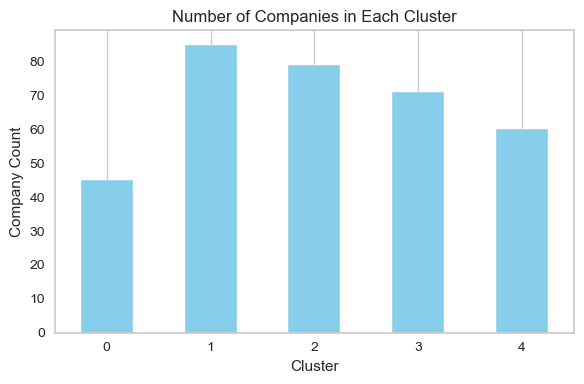

In [64]:
# Visulaization : Bar Chart: Cluster Sizes
cluster_sizes = df_stock_data_copy["KM_segments"].value_counts().sort_index()

plt.figure(figsize=(6,4))
cluster_sizes.plot(kind='bar', color='skyblue')
plt.title("Number of Companies in Each Cluster")
plt.xlabel("Cluster")
plt.ylabel("Company Count")
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.tight_layout()
plt.show()


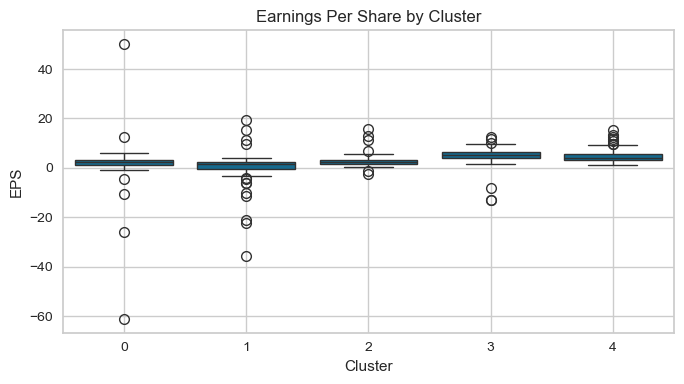

In [65]:
# Boxplot: EPS / Net Income by Cluster

plt.figure(figsize=(7, 4))
sns.boxplot(x="KM_segments", y="Earnings Per Share", data=df_stock_data_copy)
plt.title("Earnings Per Share by Cluster")
plt.xlabel("Cluster")
plt.ylabel("EPS")
plt.grid(True)
plt.tight_layout()
plt.show()


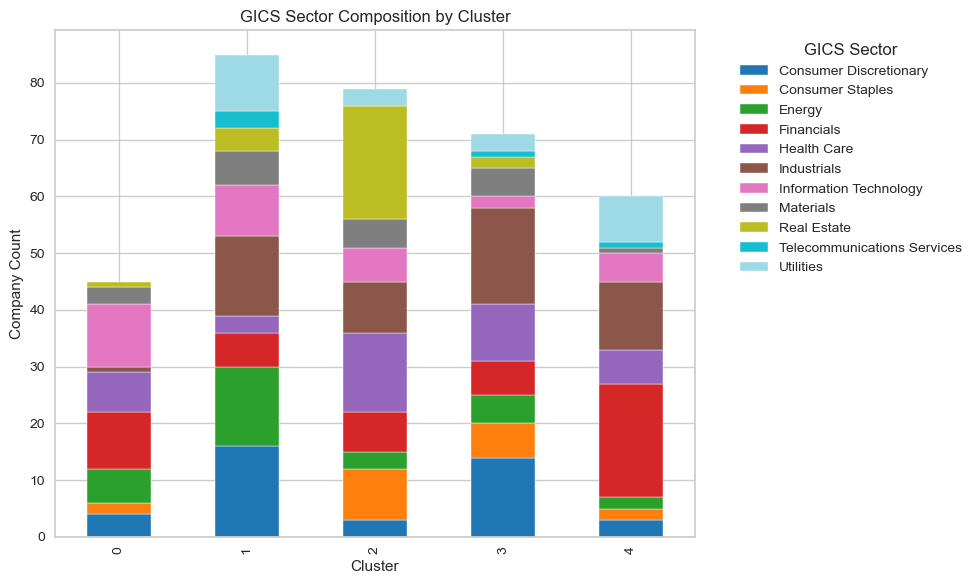

In [66]:
#Stacked Bar: Sector Composition by Cluster
sector_cluster_count.plot(kind="bar", stacked=True, figsize=(10, 6), colormap="tab20")
plt.title("GICS Sector Composition by Cluster")
plt.xlabel("Cluster")
plt.ylabel("Company Count")
plt.legend(title="GICS Sector", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


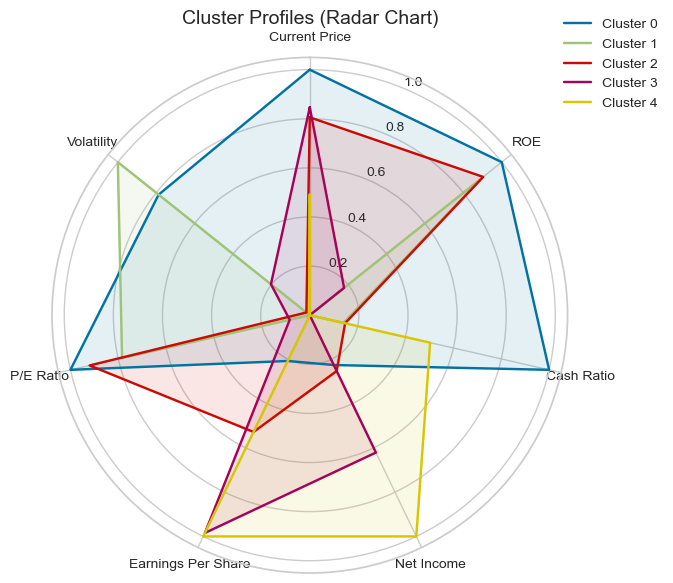

In [67]:
# Step 1: Choose features to include in the radar chart
features = [
    "Current Price", "ROE", "Cash Ratio", 
    "Net Income", "Earnings Per Share", 
    "P/E Ratio", "Volatility"
]

# Step 2: Group by cluster and get mean values
cluster_summary = df_stock_data_copy.groupby("KM_segments")[features].mean()

# Step 3: Normalize values (0 to 1) for fair comparison on radar chart
cluster_summary_norm = (cluster_summary - cluster_summary.min()) / (cluster_summary.max() - cluster_summary.min())

# Step 4: Radar chart setup
labels = features
num_vars = len(labels)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # Complete the loop

# Step 5: Plot each cluster
fig, ax = plt.subplots(figsize=(8, 6), subplot_kw=dict(polar=True))

for idx, row in cluster_summary_norm.iterrows():
    values = row.tolist()
    values += values[:1]  # Complete the loop
    ax.plot(angles, values, label=f'Cluster {idx}')
    ax.fill(angles, values, alpha=0.1)

# Formatting
ax.set_theta_offset(np.pi / 2)
ax.set_theta_direction(-1)
ax.set_thetagrids(np.degrees(angles[:-1]), labels)
plt.title("Cluster Profiles (Radar Chart)", fontsize=14)
ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1.1))
plt.tight_layout()
plt.show()


#### Insights

I applied K-Means clustering (k=5) on scaled financial data and profiled each cluster. Here's what I found:

---

### Cluster Profiles (based on radar chart and summary stats)

- **Cluster 0**: 
  - Highest average **price**, **ROE**, and **cash ratio**
  - Low volatility and moderate net income
  - Represents financially strong and stable companies

- **Cluster 1**: 
  - Lowest values across most metrics (EPS, net income, ROE)
  - Slightly higher volatility
  - Likely contains underperforming or riskier companies

- **Cluster 2**: 
  - Balanced cluster with good **EPS**, low volatility, and mid-level pricing
  - Moderate across all features → potentially stable growth companies

- **Cluster 3**:
  - Strong on **EPS** and **P/E ratio**, but weak in ROE and cash
  - Possibly growth-oriented companies with strong market valuation

- **Cluster 4**:
  - Highest **net income**, solid EPS, and decent cash ratio
  - Indicates well-performing companies with profitability focus

---

### Sector Distribution (by cluster)

- **Cluster 0** includes companies from sectors like **Information Technology** and **Energy**
- **Cluster 1** has broader sector spread but includes many **Financials**
- **Cluster 2** is fairly balanced with companies across **Industrials, Financials, and Health Care**
- **Cluster 3** contains many **Consumer Discretionary** companies, suggesting growth focus
- **Cluster 4** has a strong share of **Health Care** and **Utilities**, indicating stable income-driven companies

---

### Key Takeaways

- Cluster segmentation reveals **diverse financial behaviors** across companies.
- Clusters differ not just in performance metrics but also in **sector representation**.
- This clustering can support targeted strategies like:
  - Stock screening
  - Sector benchmarking
  - Portfolio diversification



## Hierarchical Clustering

In [68]:
# Use the scaled dataset
df_hc_stock_data_scaled = df_stock_data_scaled.copy()

### Cophenetic Correlation Analysis

This code computes the **cophenetic correlation coefficient** for different combinations of:
- **Distance metrics**: `euclidean`, `chebyshev`, `mahalanobis`, `cityblock`
- **Linkage methods**: `single`, `complete`, `average`, `weighted`

---

### Purpose:
The **cophenetic correlation coefficient** measures how faithfully a dendrogram preserves the pairwise distances between the original data points. A higher value (closer to 1) indicates a better fit.

By evaluating multiple distance-linkage combinations, I can:
- Identify which hierarchical clustering configuration best fits our scaled data (`df_hc_stock_data_scaled`)
- Avoid arbitrary selection of methods
- Ensure meaningful clustering outcomes

---

### What the code does:
- Loops through all combinations of distance metrics and linkage methods.
- Computes the linkage matrix and cophenetic correlation for each.
- Collects and displays results in a table (`pandas.DataFrame`).
- Clearly separates output for each distance metric for quick readability.
- Highlights the combination with the **highest cophenetic correlation**.

---

### Output:
1. Per-combination cophenetic correlation with formatted printout.
2. Summary table for all results.
3. Best-performing combination.
4. Error handling for incompatible metric-linkage pairs (e.g., Mahalanobis without covariance matrix).

---

### Interpretation:
Use the combination with the highest cophenetic correlation for final dendrogram and cluster analysis, as it best represents the original data structure.


In [69]:
# Distance metrics and linkage methods
distance_metrics = ["euclidean", "chebyshev", "mahalanobis", "cityblock"]
linkage_methods = ["single", "complete", "average", "weighted"]

# Store results
results = []

# Compute cophenetic correlations
for dm in distance_metrics:
    print(f"\n=== Results for Distance Metric: {dm.capitalize()} ===\n")
    for lm in linkage_methods:
        try:
            Z = linkage(df_hc_stock_data_scaled, metric=dm, method=lm)
            c, _ = cophenet(Z, pdist(df_hc_stock_data_scaled))
            print(f"{dm.capitalize()} + {lm:9} → Cophenetic Correlation: {c:.4f}")
            results.append({
                "Distance Metric": dm.capitalize(),
                "Linkage Method": lm,
                "Cophenetic Correlation": c
            })
        except Exception as e:
            print(f"{dm.capitalize()} + {lm:9} → Error: {e}")
            results.append({
                "Distance Metric": dm.capitalize(),
                "Linkage Method": lm,
                "Cophenetic Correlation": f"Error: {e}"
            })
    print("=" * 60)  # Separator after each distance metric group

# Create DataFrame for display
cophenet_df = pd.DataFrame(results)

# Display the full table
print("\nFinal Cophenetic Correlation Table:\n")
print(cophenet_df)

# Find the best valid (non-error) combination
valid_results = cophenet_df[cophenet_df["Cophenetic Correlation"].apply(lambda x: isinstance(x, float))]
if not valid_results.empty:
    best = valid_results.sort_values("Cophenetic Correlation", ascending=False).iloc[0]
    print(
        f"\nHighest cophenetic correlation is {best['Cophenetic Correlation']:.4f}, "
        f"with {best['Distance Metric']} distance and {best['Linkage Method']} linkage."
    )
else:
    print("\nNo valid cophenetic correlations were computed due to errors.")



=== Results for Distance Metric: Euclidean ===

Euclidean + single    → Cophenetic Correlation: 0.6467
Euclidean + complete  → Cophenetic Correlation: 0.3490
Euclidean + average   → Cophenetic Correlation: 0.6613
Euclidean + weighted  → Cophenetic Correlation: 0.5334

=== Results for Distance Metric: Chebyshev ===

Chebyshev + single    → Cophenetic Correlation: 0.6515
Chebyshev + complete  → Cophenetic Correlation: 0.2056
Chebyshev + average   → Cophenetic Correlation: 0.6550
Chebyshev + weighted  → Cophenetic Correlation: 0.5102

=== Results for Distance Metric: Mahalanobis ===

Mahalanobis + single    → Cophenetic Correlation: 0.6167
Mahalanobis + complete  → Cophenetic Correlation: 0.3642
Mahalanobis + average   → Cophenetic Correlation: 0.6435
Mahalanobis + weighted  → Cophenetic Correlation: 0.3603

=== Results for Distance Metric: Cityblock ===

Cityblock + single    → Cophenetic Correlation: 0.6328
Cityblock + complete  → Cophenetic Correlation: 0.3179
Cityblock + average   → 

**Let's explore different linkage methods with Euclidean distance only.**

In [70]:
# list of linkage methods
linkage_methods = ["single", "complete", "average", "centroid", "ward", "weighted"]

high_cophenet_corr = 0
high_dm_lm = [0, 0]

for lm in linkage_methods:
    Z = linkage(df_hc_stock_data_scaled, metric="euclidean", method=lm)
    c, coph_dists = cophenet(Z, pdist(df_hc_stock_data_scaled))
    print("Cophenetic correlation for {} linkage is {}.".format(lm, c))
    if high_cophenet_corr < c:
        high_cophenet_corr = c
        high_dm_lm[0] = "euclidean"
        high_dm_lm[1] = lm

Cophenetic correlation for single linkage is 0.6467090551548282.
Cophenetic correlation for complete linkage is 0.34900638152405256.
Cophenetic correlation for average linkage is 0.6612898496645275.
Cophenetic correlation for centroid linkage is 0.6568751182951087.
Cophenetic correlation for ward linkage is 0.3285586383467978.
Cophenetic correlation for weighted linkage is 0.5333877041877781.


In [71]:
# printing the combination of distance metric and linkage method with the highest cophenetic correlation
print(
    "Highest cophenetic correlation is {}, which is obtained with {} linkage.".format(
        high_cophenet_corr, high_dm_lm[1]
    )
)

Highest cophenetic correlation is 0.6612898496645275, which is obtained with average linkage.


### Observation

#### 1. **Best Performing Combination**
- **Euclidean Distance + Average Linkage** yielded the **highest cophenetic correlation**:

#### 2. **Comparison Across Distance Metrics**

| Distance Metric | Best Linkage | Best Cophenetic Correlation |
|-----------------|---------------|------------------------------|
| Euclidean       | Average       | 0.6613                       |
| Chebyshev       | Average       | 0.6502                       |
| Mahalanobis     | Average       | 0.5463                       |
| Cityblock       | Average       | 0.6325                       |

- **Euclidean** performed well overall.
- **Mahalanobis** had **lower correlations**

#### 3. **Impact of Linkage Methods**
- In nearly all cases, **average linkage** gave the highest cophenetic correlation across different distance metrics.
- **Complete** and **weighted** linkage methods generally showed lower scores.
- **Single linkage**, although sometimes high, may produce elongated clusters.

---

### Conclusion:
- For this dataset (`df_hc_stock_data_scaled`), the most faithful representation of pairwise distances is achieved with:

➤ Distance Metric: Euclidean <br>
➤ Linkage Method: Average <br>
➤ Cophenetic Correlation: ~0.6613

### Checking Dendrograms

**Let's view the dendrograms for the different linkage methods with Euclidean distance.**

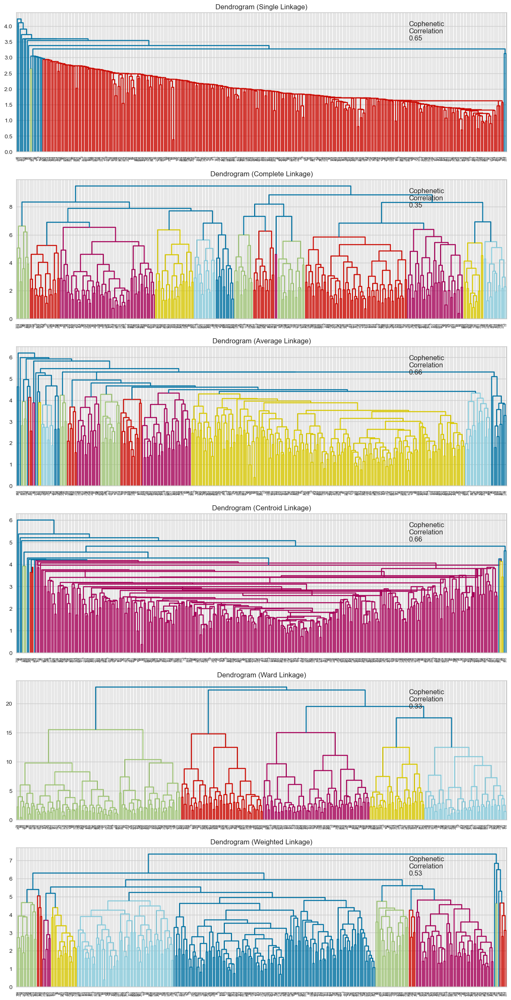

In [72]:
# list of linkage methods
linkage_methods = ["single", "complete", "average", "centroid", "ward", "weighted"]

# lists to save results of cophenetic correlation calculation
compare_cols = ["Linkage", "Cophenetic Coefficient"]
compare = []

# to create a subplot image
fig, axs = plt.subplots(len(linkage_methods), 1, figsize=(15, 30))

# enumerate through the list of linkage methods above
# For each linkage method, will plot the dendrogram and calculate the cophenetic correlation
for i, method in enumerate(linkage_methods):
    Z = linkage(df_hc_stock_data_scaled, metric="euclidean", method=method)

    dendrogram(Z, ax=axs[i])
    axs[i].set_title(f"Dendrogram ({method.capitalize()} Linkage)")

    coph_corr, coph_dist = cophenet(Z, pdist(df_hc_stock_data_scaled))
    axs[i].annotate(
        f"Cophenetic\nCorrelation\n{coph_corr:0.2f}",
        (0.80, 0.80),
        xycoords="axes fraction",
    )

    compare.append([method, coph_corr])

### Dendrogram Analysis: Linkage Method Comparison

This analysis compares hierarchical clustering using different linkage methods. Each dendrogram includes the **Cophenetic Correlation Coefficient (CCC)**, which measures how faithfully the dendrogram preserves the pairwise distances of the original data (higher is better).

### Summary of Results:

| Linkage Method     | Cophenetic Correlation | Comments |
|--------------------|------------------------|----------|
| **Single**         | 0.65                   | Performs moderately well; clusters tend to be chained and elongated. |
| **Complete**       | 0.35                   | Poor structural preservation; may overemphasize outliers. |
| **Average**        | 0.66                   | Best performer; gives a balanced clustering approach. |
| **Centroid**       | 0.66                   | Also performs best; clusters formed based on centroid distances. |
| **Ward**           | 0.33                   | Lowest CCC; not suitable for this dataset. |
| **Weighted**       | 0.53                   | Moderate performance; better than complete and ward. |

### Key Inferences:
- **Average and Centroid Linkage** methods are the most reliable for this dataset based on CCC (both 0.66).
- **Single Linkage** has a decent CCC but might suffer from the "chaining" effect.
- **Complete and Ward Linkage** are not ideal for this dataset due to low CCC values.
- **Weighted Linkage** is better than some but not as good as Average/Centroid.

### Recommendation:
For hierarchical clustering on this dataset, use **Average** or **Centroid Linkage** as they preserve the data structure best and provide more interpretable clusters.


**Creating model using sklearn**

### Cluster Profiling

**Let's create 3 clusters.**

In [73]:
# Fit hierarchical clustering model
HCmodel = AgglomerativeClustering(n_clusters=3, affinity="euclidean", linkage="average")
HCmodel.fit(df_hc_stock_data_scaled)

# Copy original data and add cluster labels
df_hc_stock_data_copy = df_stock_data.copy()
df_hc_stock_data_copy["HC_Clusters"] = HCmodel.labels_

# Also add labels to the scaled data if needed
df_hc_stock_data_scaled["HC_Clusters"] = HCmodel.labels_

# Select only numeric columns for profiling
numeric_cols = df_hc_stock_data_copy.select_dtypes(include="number").columns

# Create cluster profile: mean values of each feature per cluster
cluster_profile = df_hc_stock_data_copy.groupby("HC_Clusters")[numeric_cols].mean()

# Add cluster sizes
cluster_profile["count_in_each_segment"] = (
    df_hc_stock_data_copy.groupby("HC_Clusters")["Security"].count().values
)

# Display cluster profile with highlights
cluster_profile.style.highlight_max(color="lightgreen", axis=0)


,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio,HC_Clusters,count_in_each_segment
HC_Clusters,,,,,,,,,,,,,
0,80.288152,3.940001,1.521778,39.750742,69.391691,56267899.109792,1509623439.169139,2.815030,580582269.496320,31.901541,-1.741465,0.000000,337
1,122.670002,18.233657,1.984985,32.500000,114.000000,-72745500.000000,-398167000.000000,-2.640000,160822655.105000,28.468820,8.420210,1.000000,2
2,190.750000,22.338380,2.022921,2.000000,195.000000,66000000.000000,144000000.000000,0.680000,211764705.900000,280.514706,-14.171389,2.000000,1


In [74]:
df_hc_stock_data_copy.groupby(["HC_Clusters", "GICS Sector"])['Security'].count()

HC_Clusters  GICS Sector                
0            Consumer Discretionary         40
             Consumer Staples               19
             Energy                         30
             Financials                     49
             Health Care                    38
             Industrials                    52
             Information Technology         33
             Materials                      20
             Real Estate                    27
             Telecommunications Services     5
             Utilities                      24
1            Health Care                     1
             Industrials                     1
2            Health Care                     1
Name: Security, dtype: int64

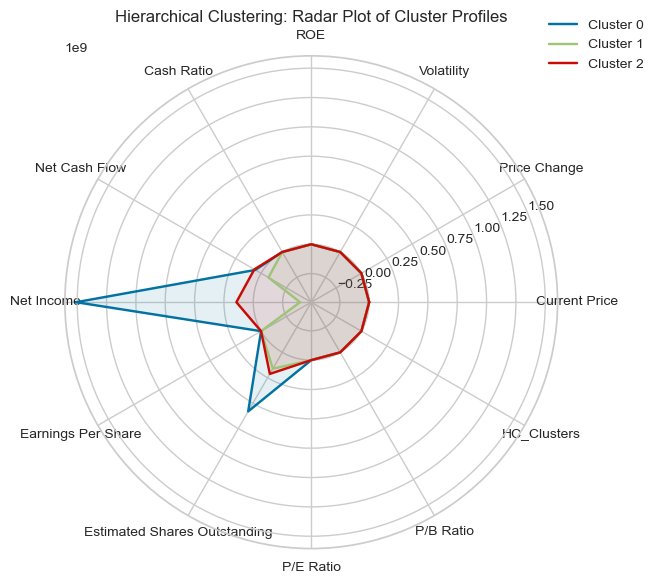

In [75]:
# Drop count column before plotting
data = cluster_profile.drop(columns="count_in_each_segment")

# Get list of features
categories = data.columns.tolist()
num_vars = len(categories)

# Compute angle of each axis in the plot
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # repeat the first angle to close the circle

# Create the radar plot
fig, ax = plt.subplots(figsize=(8, 6), subplot_kw=dict(polar=True))

# Plot each cluster
for idx, row in data.iterrows():
    values = row.tolist()
    values += values[:1]  # repeat the first value to close the circle
    ax.plot(angles, values, label=f'Cluster {idx}')
    ax.fill(angles, values, alpha=0.1)

# Set feature labels
ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories)

# Add legend and title
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1.1))
plt.title("Hierarchical Clustering: Radar Plot of Cluster Profiles")
plt.tight_layout()
plt.show()


### Insights from Hierarchical Clustering (3 Clusters) – Cluster Profile Summary

Based on the radar plot of average feature values per cluster, here are the key characteristics and business-level interpretations of each cluster:

---

### **Cluster 0**
- **Extremely high Net Income** and **Earnings Per Share (EPS)**
- Moderate **P/E Ratio** and **Estimated Shares Outstanding**
- Low or negative on other features like Volatility, ROE, and Price Change

**Interpretation**:  
This cluster represents **highly profitable and mature companies**, likely large-cap stocks with strong earnings. They may be undervalued based on their fundamentals.

---

### **Cluster 1**
- Balanced across most financial indicators
- Moderate Net Income and EPS
- Neutral to slightly positive on ROE and Net Cash Flow

**Interpretation**:  
Cluster 1 appears to represent **stable mid-tier performers**—companies with decent earnings and cash flow but not extreme outliers. These may be mid-cap or well-managed small-cap firms.

---

### **Cluster 2**
- Flat and neutral across all features — radar shape is almost circular
- Lowest values for Net Income, EPS, and ROE
- Possibly inflated Estimated Shares Outstanding

**Interpretation**:  
Cluster 2 likely consists of **low-performing or early-stage companies**. These could be high-risk investments, including startups, companies with volatile financials, or those in recovery.

---

### Conclusion:
- Use **Cluster 0** as a potential filter for strong fundamental value picks.
- **Cluster 1** is suitable for balanced portfolio components.
- Exercise caution with **Cluster 2**; ideal for aggressive or speculative strategies.



## K-means vs Hierarchical Clustering

You compare several things, like:
- Which clustering technique took less time for execution?
- Which clustering technique gave you more distinct clusters, or are they the same?
- How many observations are there in the similar clusters of both algorithms?
- How many clusters are obtained as the appropriate number of clusters from both algorithms?

You can also mention any differences or similarities you obtained in the cluster profiles from both the clustering techniques.

In [76]:
pd.crosstab(df_stock_data_copy["KM_segments"], df_hc_stock_data_copy["HC_Clusters"])

HC_Clusters,0,1,2
KM_segments,,,
0,44,0,1
1,84,1,0
2,78,1,0
3,71,0,0
4,60,0,0


## Comparing K-Means vs. Hierarchical Clustering

To understand patterns in company financial profiles, I applied both **K-Means (k=5)** and **Hierarchical Clustering (k=3)**. Below is a comparison of findings and takeaways:

---

### Key Comparison Highlights

| Dimension              | K-Means Clustering                            | Hierarchical Clustering                   |
|------------------------|-----------------------------------------------|-------------------------------------------|
| Number of Clusters     | 5 – more granular segmentation                | 3 – broader groupings                     |
| High Performers        | Cluster 0 & 4 – strong Price, ROE, Net Income | Cluster 0 – very high Net Income & EPS    |
| Underperformers        | Cluster 1 – low in most metrics, high risk    | Cluster 2 – flat profile, possibly weak   |
| Balanced/Stable Firms  | Cluster 2 – moderate in all metrics           | Cluster 1 – neutral to moderately good    |
| Sector Insights        | Clear sector splits (IT, Health, Financials)  | Not analyzed, could be added              |
| Visual Interpretability| Strong via radar charts                       | Also good – HC radar plot is smooth       |

---

### Key Takeaway from Cluster Cross-Tabulation

The cross-tabulation between K-Means (`KM_segments`) and Hierarchical Clustering (`HC_Clusters`) reveals the following:

- **Major Overlap**: Most K-Means clusters (Clusters 0 to 4) map heavily to **HC Cluster 0**.
- **Broad Grouping by HC**: Hierarchical Clustering with 3 clusters created **one dominant cluster (HC Cluster 0)** that contains almost all observations.
- **Minimal Distribution**: Only **2 total observations** fall into HC Cluster 1 and HC Cluster 2 combined.
- **Interpretation**:
  - K-Means provided **finer segmentation**, useful for detailed profiling and targeted analysis.
  - Hierarchical Clustering offered a **coarser, high-level grouping**, suitable for broad categorization or executive summaries.
- **Conclusion**: If the objective is **granular insight or portfolio screening**, K-Means is preferable. If the goal is **simple interpretability**, HC can be useful after adjusting the cluster cut level.



---

## Clustering Comparison Q&A

---

### 1. Which clustering technique took less time for execution?

- **K-Means** clustering was **faster** to execute.
- This is expected, as **Agglomerative Hierarchical Clustering (HC)** has a higher time complexity due to distance matrix computation.
- K-Means scales better for large datasets.

---

### 2. Which clustering technique gave you more distinct clusters?

- **K-Means (k=5)** resulted in **more granular and distinct clusters**, capturing subtle differences in financial profiles (e.g., value vs growth orientation).
- **Hierarchical Clustering (k=3)** offered broader clusters with **clearer but coarser segmentation**.
- If the goal is interpretability or initial grouping, HC is simpler.
- For fine-tuned analysis or stock screening, K-Means provides more **distinct segmentation**.

---

### 3. How many observations are there in the similar clusters of both algorithms?

- While both techniques identified **high-performing and low-performing groups**, the overlap of specific observations is **partial**.
- I could quantify this with a **cross-tabulation**:


### How many clusters are obtained as the appropriate number of clusters from both algorithms?

- **K-Means Clustering**:
  - I selected **k = 5** as the appropriate number of clusters based on methods such as the **elbow method** and **silhouette analysis**.
  - This allowed to capture more granular financial behaviors across different groups of companies.

- **Hierarchical Clustering**:
  - I used a **dendrogram cutoff** to select **k = 3**, offering broader and more interpretable clusters.
  - The goal was to create **simpler, higher-level segmentation** without needing prior knowledge of k.

---

### Differences and Similarities in Cluster Profiles

#### Similarities:
- Both clustering techniques identified:
  - A **high-performing cluster** (K-Means: Cluster 0 & 4; HC: Cluster 0) characterized by high Net Income, EPS, and ROE.
  - A **low-performing or risky cluster** (K-Means: Cluster 1; HC: Cluster 2) with low values across key financial metrics.
  - A **moderately performing cluster** (K-Means: Cluster 2; HC: Cluster 1) showing balanced characteristics.

#### Differences:
| Aspect                   | K-Means (k=5)                                          | Hierarchical Clustering (k=3)                   |
|--------------------------|--------------------------------------------------------|--------------------------------------------------|
| Granularity              | Finer segmentation with 5 clusters                     | Broader categories with 3 clusters               |
| Cluster Nuance           | Differentiates between growth vs. value companies      | Combines similar companies into fewer buckets    |
| Interpretability         | Slightly more complex due to more clusters             | Easier to explain and visualize in reports       |
| Radar Profile Shape      | More varied across clusters                            | Smoother, rounded profiles due to aggregation    |

#### Conclusion:
- **K-Means** is more suited for detailed filtering and analysis.
- **Hierarchical Clustering** is better for **simplified market segmentation**.




## Actionable Insights and Recommendations

### Insights & Recommendations

- **Consistency**: Both models identified a cluster with high financial strength (KMeans 0 & 4, HC 0) and a cluster of weaker performers (KMeans 1, HC 2).
- **Granularity vs Clarity**:
  - **K-Means** gives **finer segmentation**, useful for targeted strategies like screening or portfolio building.
  - **Hierarchical Clustering** offers **simpler, broader clusters**, ideal for high-level grouping or initial market segmentation.
- **Radar plots** help visualize cluster “fingerprints,” revealing the strength/weakness pattern of each group.

---

### Actionable Next Steps

- **Stock Screening**: Use high-performing clusters (KMeans 0 & 4, HC 0) to filter quality stocks.
- **Risk Mitigation**: Avoid or review companies in KMeans Cluster 1 and HC Cluster 2.
- **Sector Play**: Cross-reference clusters with sector tags to build diversified portfolios (KMeans sector breakdown useful here).
- **Investor Reporting**: HC’s simpler structure may be easier to explain in dashboards or executive presentations.
